In [1]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)



## Some background reading

###### Space Weather:
- [Introduction](https://ccmc.gsfc.nasa.gov/RoR_WWW/SWREDI/2016/SpaceWeatherIntro_Bootcamp_2016.pdf)
- [Understanding space weather](https://www.sciencedirect.com/science/article/pii/S0273117715002252)

###### Particle Precipitation:
Here are a few particle precipitation resources that I believe are most valuable to start with:
- Technical details of the observations: [Redmon et al., [2017]](https://agupubs.onlinelibrary.wiley.com/doi/full/10.1002/2016JA023339)
- Creating particle precipitation models from these data: [Hardy et al., [1987]](https://doi.org/10.1029/JA090iA05p04229) and [Newell et al., [2009]](https://doi.org/10.1029/2009JA014326)
- Considered the 'state of the art' model: [OVATION PRIME](https://ccmc.gsfc.nasa.gov/models/modelinfo.php?model=Ovation%20Prime)



## Imports and utility functions


In [2]:
import numpy as np
import os
import pandas as pd
import seaborn as sns
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import datetime
from os.path import isfile, join
from sys import getsizeof
import glob

from random import *

from sklearn import *


from keras.models import Sequential, Model
from keras.layers import Dense, Conv1D, Flatten, Input, LSTM, TimeDistributed, MaxPooling1D
from keras.layers.merge import concatenate

import keras.backend as K



import sys
print(sys.maxsize)
np.set_printoptions(threshold=sys.maxsize*2)

def mean_errors_over_range(ytrue, ypred, nbins):
    low = min(ytrue)
    high = max(ytrue)
    bins = np.linspace(low, high, nbins)
    mean_error_and_num = np.zeros((nbins,2))
    error = ytrue-ypred
    for i in range(ypred.shape[0]):
        index = int((ytrue[i]-low)/(bins[1]-bins[0]))
        mean_error_and_num[index,1]=mean_error_and_num[index,1]+1
        mean_error_and_num[index,0]+=error[i]
    
    for index in range(0,nbins-1):
        mean_error_and_num[index,0]= mean_error_and_num[index,0]/mean_error_and_num[index,1]
                      
    plotsize=(10,10)
    plt.figure(figsize=plotsize)                                  
    plt.plot(error)   
    plt.title('error vs timestep')
    plt.figure(figsize=plotsize)          
    plt.plot(mean_error_and_num[:,0])
    plt.title('mean error vs bins')
    plt.figure(figsize=plotsize)                                  
    plt.plot(mean_error_and_num[:,1])
    plt.title('number vs bins')
    plt.figure(figsize=plotsize)                                  
    plt.scatter(bins, mean_error_and_num[:,0])
    plt.title('mean error vs bins')
    plt.figure(figsize=plotsize)                                  
    plt.scatter(bins, mean_error_and_num[:,1])
    plt.title('number vs bins')
    
    print('min', low, 'max', 'high', high, 'mean true', np.mean(ytrue), 'mean pred', 
          np.mean(ypred), 'median ytrue', np.median(ytrue))#,  'mode ytrue', np.mode(ytrue))

    
    return bins, mean_error_and_num

9223372036854775807


Using TensorFlow backend.


## Prepare data for ML exploration (read in full DB created from standard_ML_DB_preparation.ipynb)


In [3]:
file_load_df_cumulative = 'ML_DB_subsamp_ext_full_dfCumulative_complexHemisphereCombine.csv'
DMSP_DATA_DIR=''
df_cumulative = pd.read_csv(os.path.join(DMSP_DATA_DIR,file_load_df_cumulative))
df_cumulative = df_cumulative.set_index('Datetimes')
df_cumulative.index = pd.to_datetime(df_cumulative.index)

cols_to_drop_validation = [c for c in df_cumulative.columns if ('STD' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
# cols_to_drop_validation = [c for c in df.columns if ('1min' in c) | ('3min' in c) | ('4min' in c) | ('5min' in c) | ('15min' in c) | ('newell' in c) | ('STD' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]

df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)


In [4]:
# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['ID_SC'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

# Construct X and y
feature_cols = [c for c in df_cumulative.columns if not 'ELE' in c]

X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
#print(numFeatures)

In [5]:
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))

%matplotlib inline  
import matplotlib.pyplot as plt
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

Y = np.array(y_train_log, dtype=np.float32)
X.shape
X[:,2].size
Y.size

1838283

In [6]:
scaler_Y = preprocessing.RobustScaler()
scaler_Y = scaler_Y.fit(np.array(y_train_erg.values ).reshape(-1, 1))
Y_val_scaled =  (scaler_Y.transform(np.array(y_val_erg.values).reshape(-1, 1)))[:,0]
Y_train_scaled = (scaler_Y.transform(np.array(y_train_erg.values).reshape(-1, 1)))[:,0]

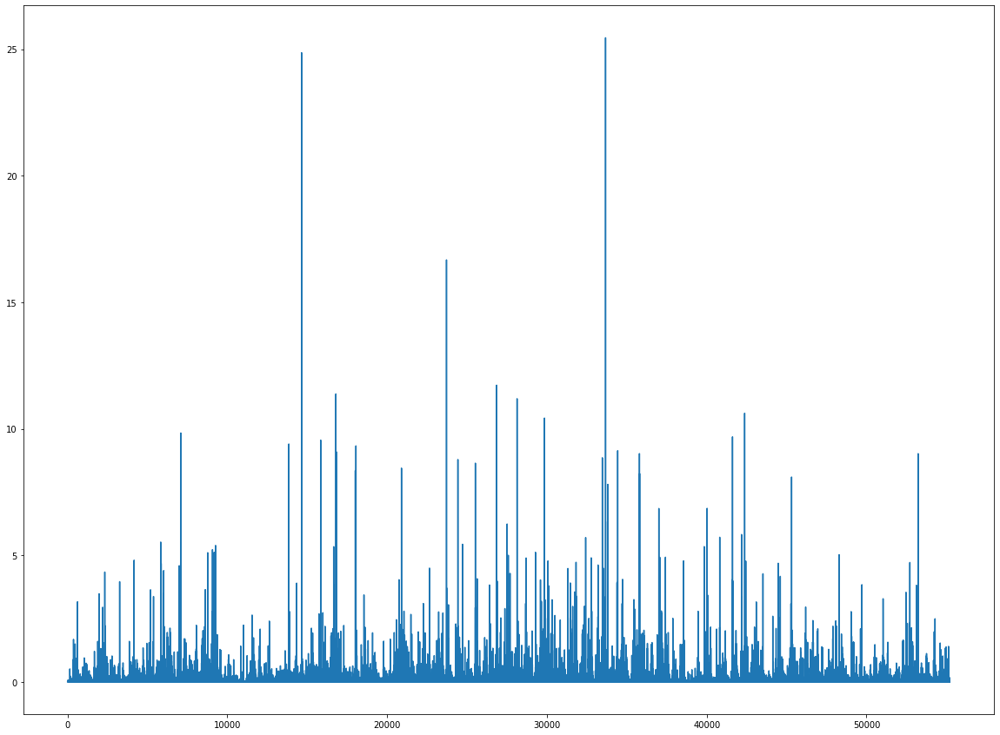

In [7]:
plt.figure(figsize=(20,15))

plt.plot(y_val_erg.values)


In [8]:
import keras.backend as K

def custom_loss(y_true,y_pred):

        return K.mean(K.sum(abs(y_pred - y_true)))

In [9]:

model = Sequential()
model.add(Dense(int(148), activation='relu'))
model.add(Dense(22, activation='relu'))
model.add(Dense(4, activation='relu'))
model.add(Dense(1))

#compile model using accuracy to measure model performance
model.compile(loss=custom_loss, optimizer='adam', metrics=['mse'])
model.fit(X, np.array(y_train_erg), validation_data=(X_test, np.array(y_val_erg)), batch_size=8192, epochs=10)


Train on 1838283 samples, validate on 55210 samples
Epoch 1/10
1838283/1838283 [==============================] - 8s 5us/step - loss: 4859.2391 - mse: 24538.5703 - val_loss: 612.1869 - val_mse: 0.1410
Epoch 2/10
1838283/1838283 [==============================] - 7s 4us/step - loss: 4778.5337 - mse: 24538.4629 - val_loss: 612.1390 - val_mse: 0.1410
Epoch 3/10
1838283/1838283 [==============================] - 6s 3us/step - loss: 4800.3851 - mse: 24538.4355 - val_loss: 612.1585 - val_mse: 0.1410
Epoch 4/10
1838283/1838283 [==============================] - 7s 4us/step - loss: 4800.3483 - mse: 24538.4570 - val_loss: 612.1166 - val_mse: 0.1410
Epoch 5/10
1838283/1838283 [==============================] - 7s 4us/step - loss: 4800.3359 - mse: 24538.4531 - val_loss: 612.1429 - val_mse: 0.1410
Epoch 6/10
1838283/1838283 [==============================] - 7s 4us/step - loss: 4799.9631 - mse: 24538.4531 - val_loss: 612.1317 - val_mse: 0.1410
Epoch 7/10
1838283/1838283 [==========================

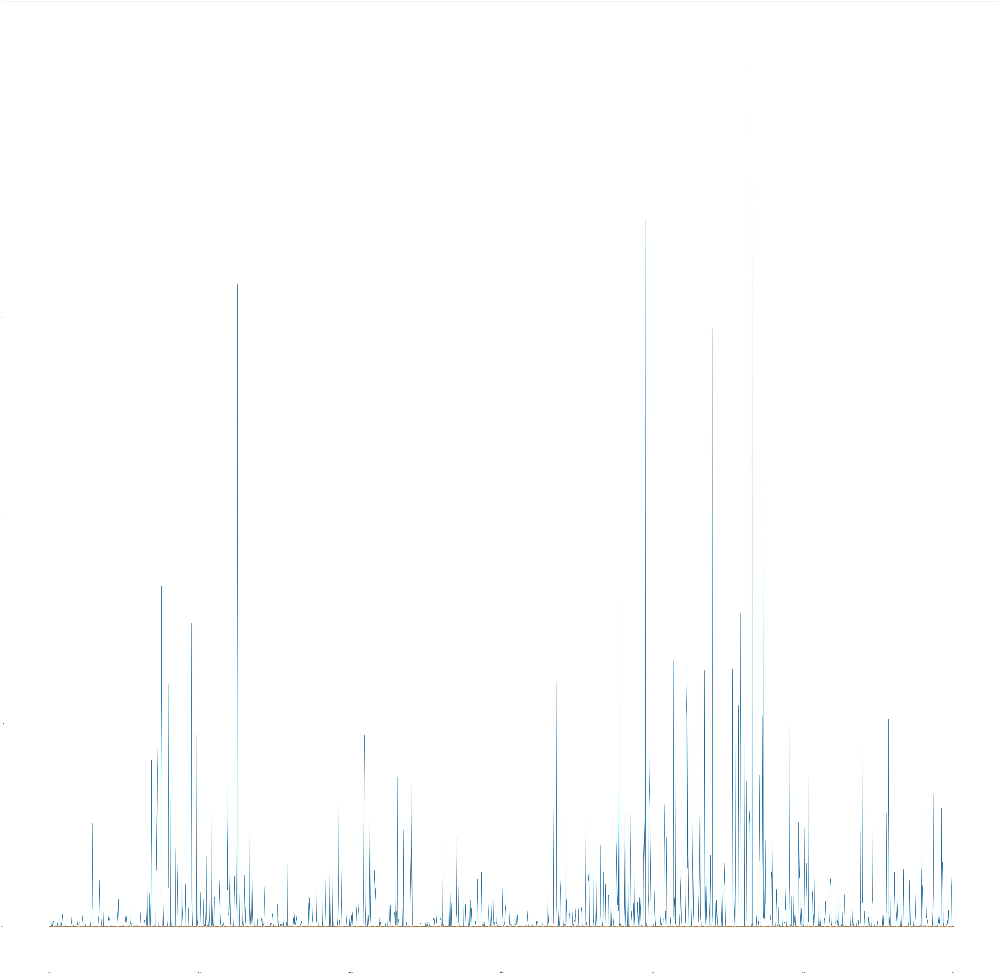

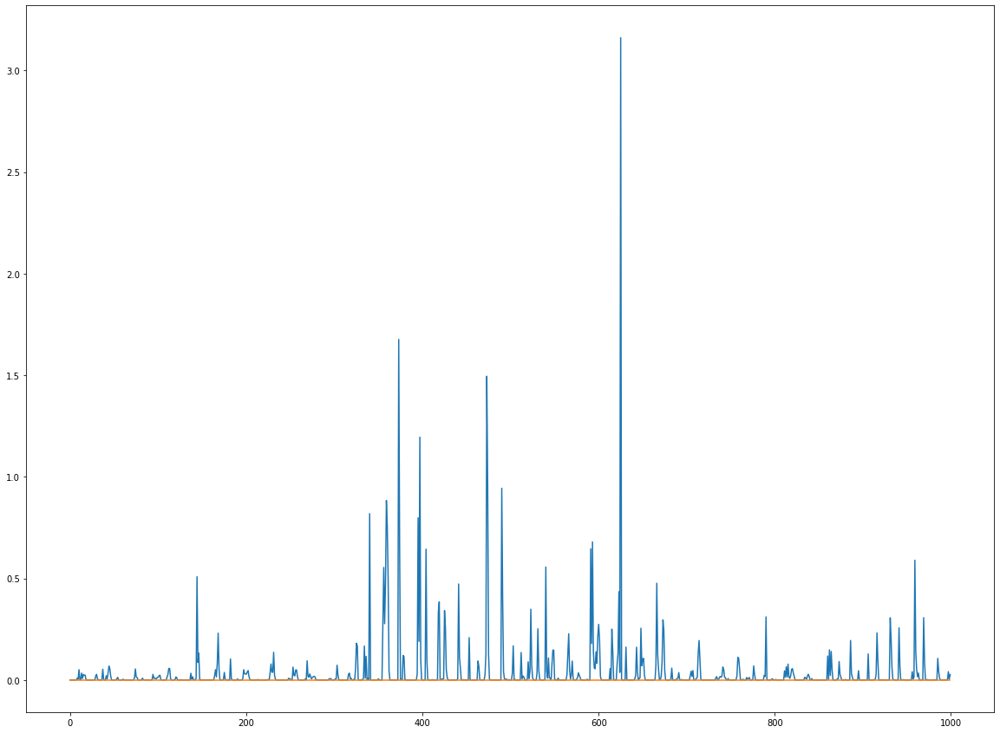

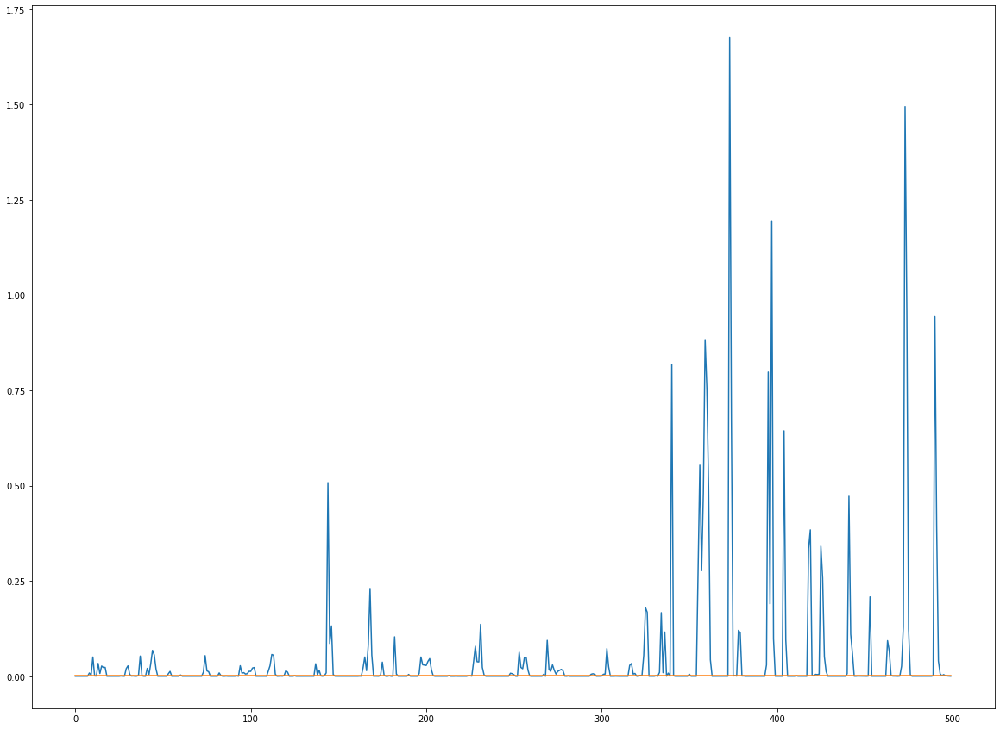

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in double_scalars


min 7.36511251176e-06 max high 25.452680090399998 mean true 0.07623178994308706 mean pred 0.0009648085 median ytrue 0.000333295657443


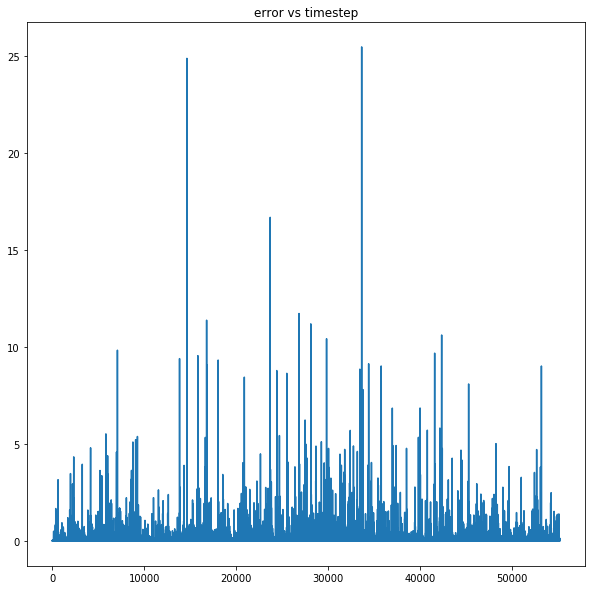

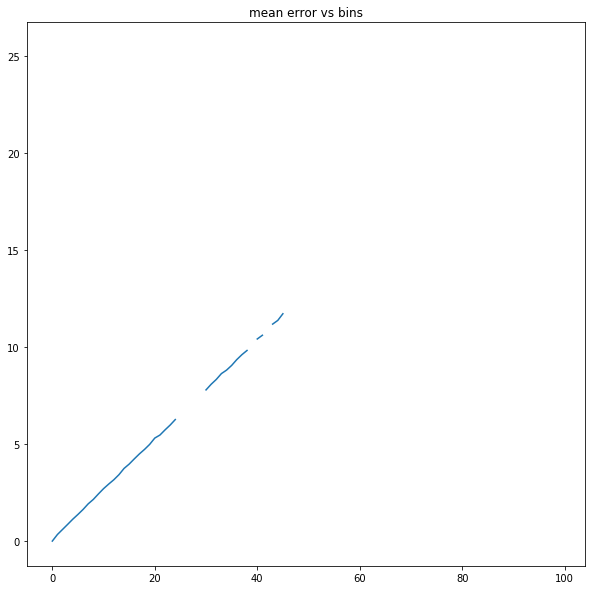

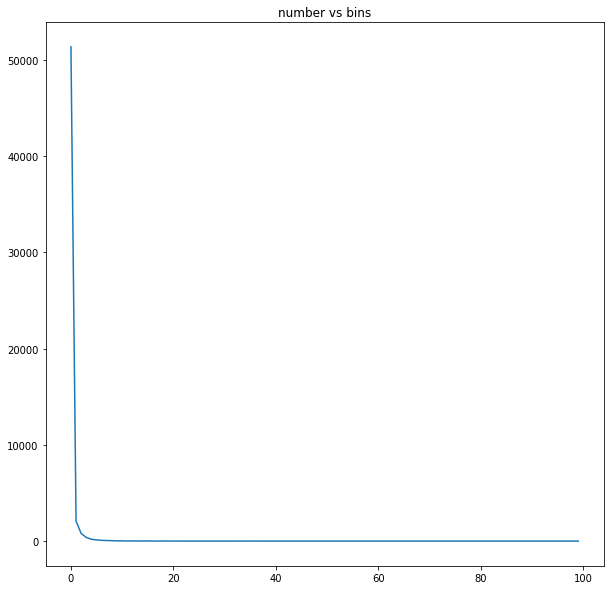

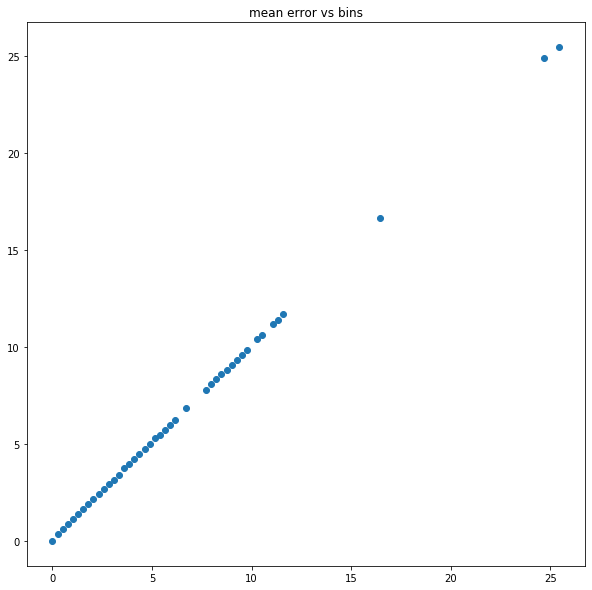

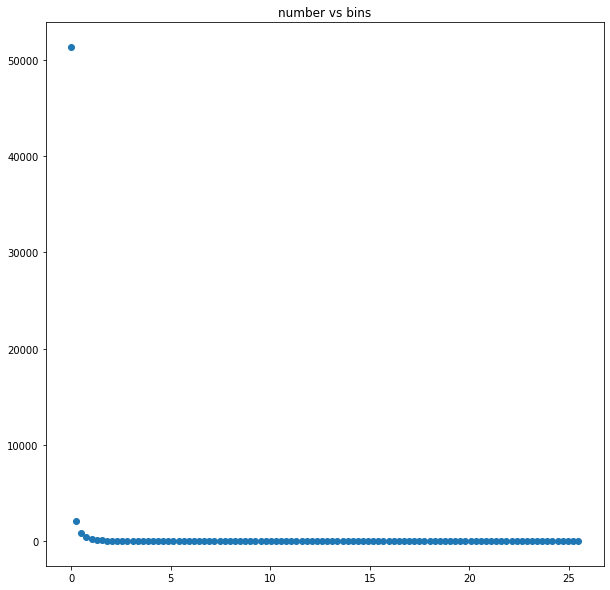

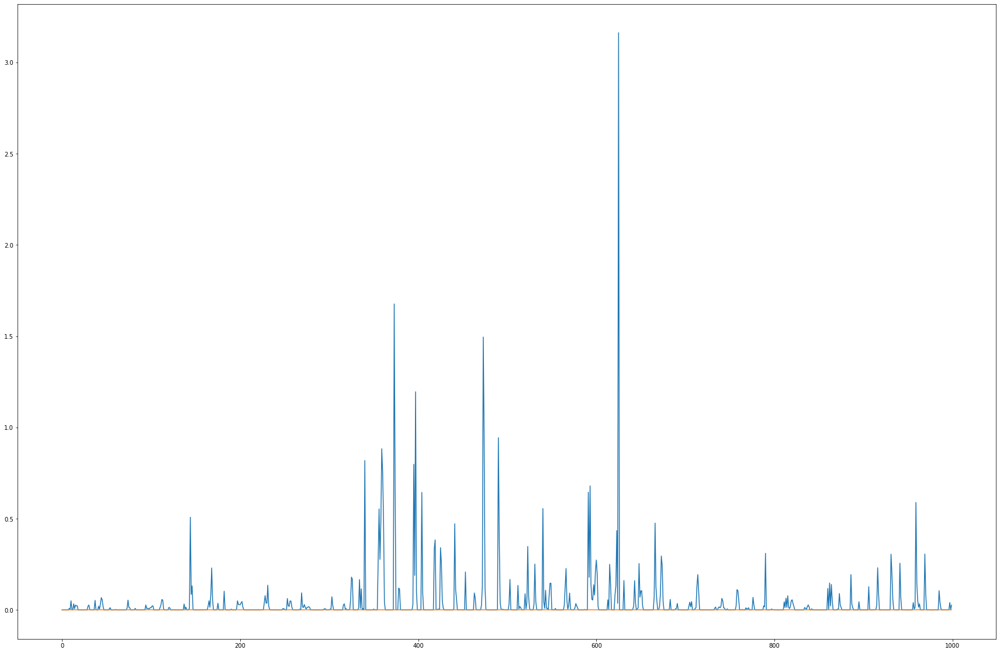

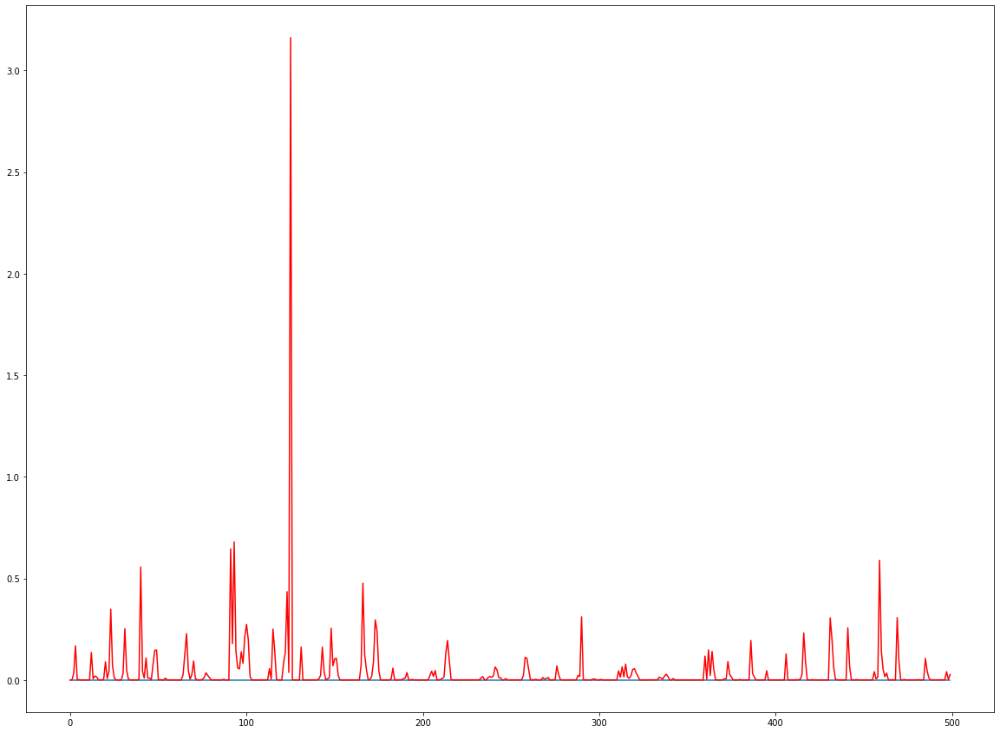

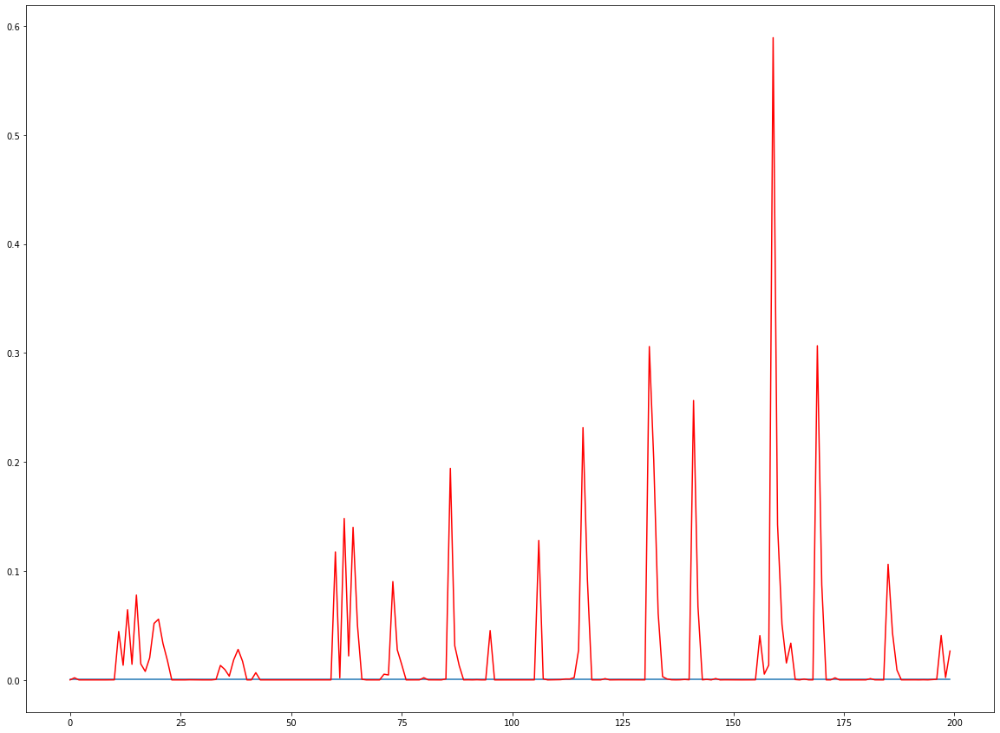

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10


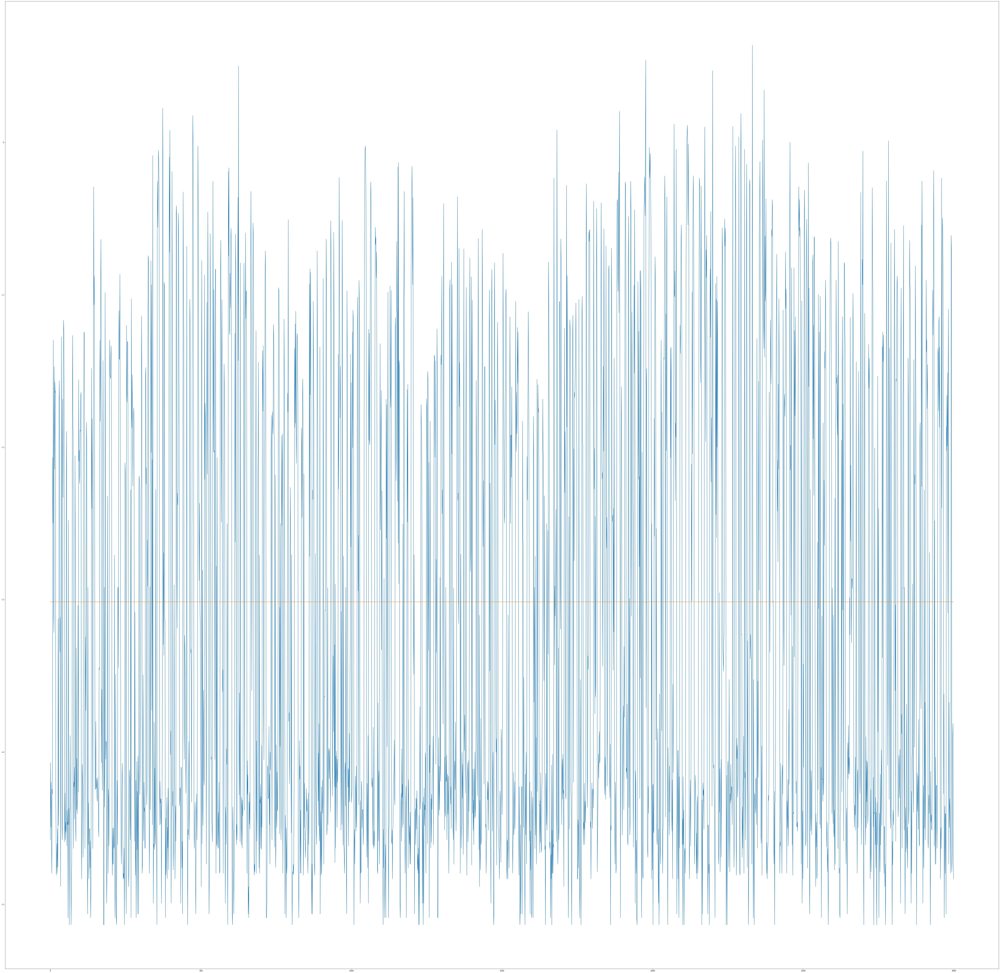

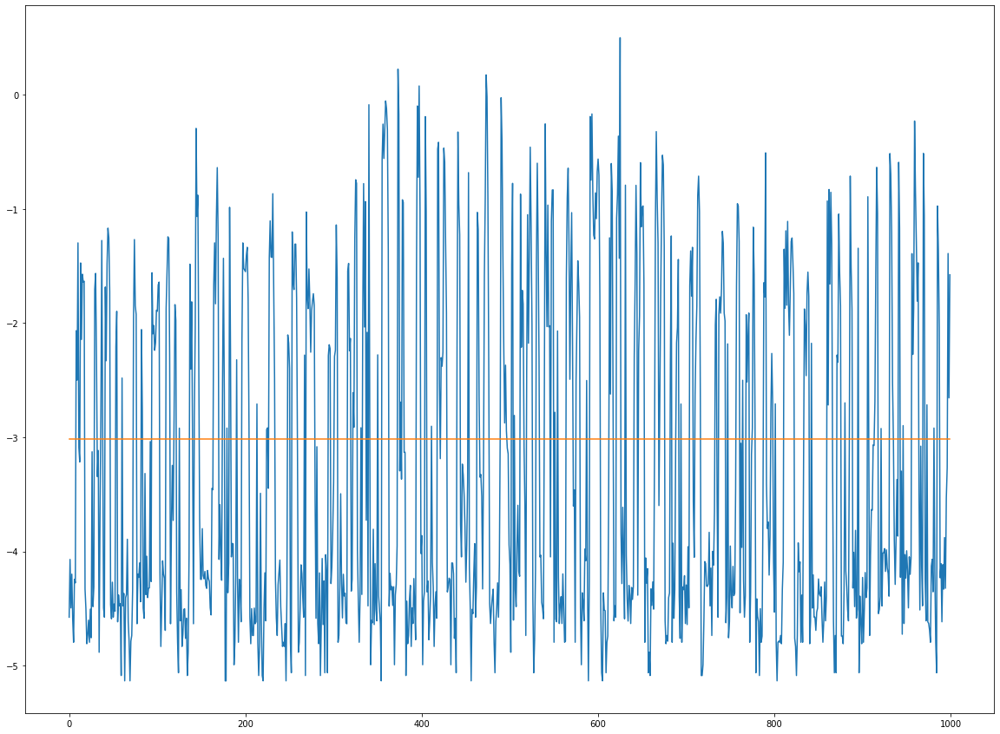

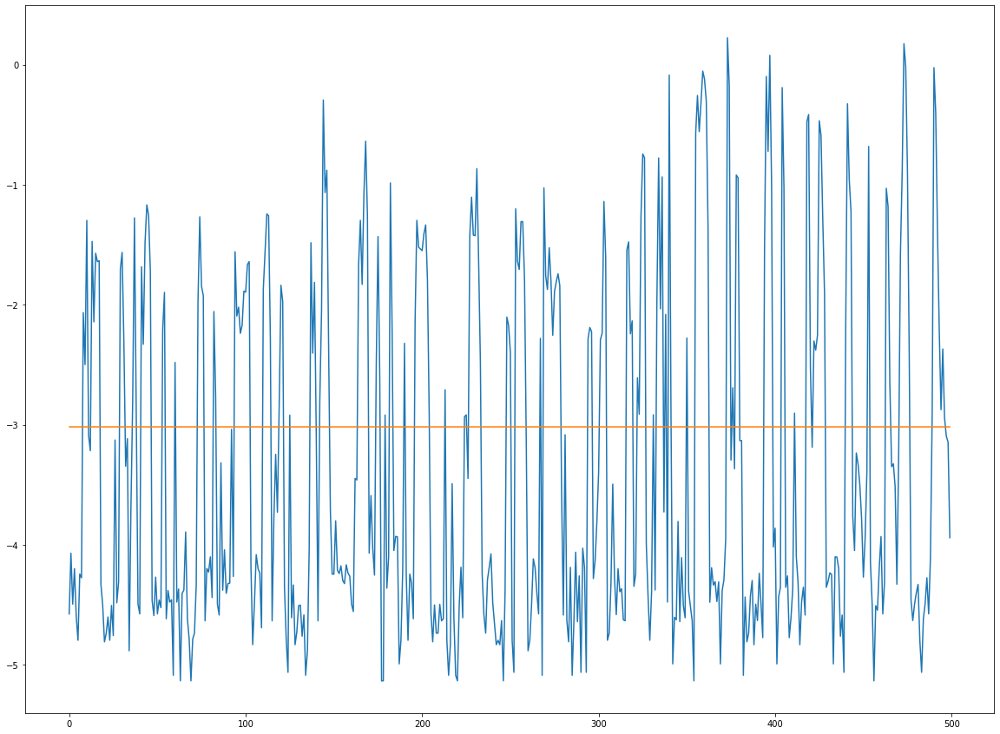

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: invalid value encountered in log10


In [ ]:
results = model.predict(X_val_scaled)#, y_val_log.values)#, batch_size=128)



plt.figure(figsize=(100,100))

plt.plot( (y_val_erg.values[:3000]))
plt.plot(results[:3000])
plt.show()
plt.figure(figsize=(20,15))

plt.plot( (y_val_erg.values[:1000]))
plt.plot(results[:1000])
plt.show()

plt.figure(figsize=(20,15))

plt.plot( (y_val_erg.values[:500]))
plt.plot(results[:500])
plt.show()


model.save('custom_no_log_16')

y_pred=results
bins, mean_error_and_num=mean_errors_over_range((y_val_erg.values), (y_pred[:,0]),100)


plt.figure(figsize=(30,20))

plt.plot((y_val_erg[0:1000].values))
plt.plot((y_pred[0:1000]))
plt.show()
plt.figure(figsize=(20,15))

plt.plot((y_pred[500:1000]))
plt.plot((y_val_erg[500:1000].values),'r')
plt.show
plt.figure(figsize=(20,15))

plt.plot((y_pred[800:1000]))
plt.plot((y_val_erg[800:1000].values),'r')
plt.show()

results = np.log10(model.predict(X_val_scaled))#, y_val_log.values)#, batch_size=128)



plt.figure(figsize=(100,100))

plt.plot( np.log10(y_val_erg.values[:3000]))
plt.plot(results[:3000])
plt.show()
plt.figure(figsize=(20,15))

plt.plot( np.log10(y_val_erg.values[:1000]))
plt.plot(results[:1000])
plt.show()

plt.figure(figsize=(20,15))

plt.plot( np.log10(y_val_erg.values[:500]))
plt.plot(results[:500])
plt.show()


y_pred=results
bins, mean_error_and_num=mean_errors_over_range(np.log10(np.array(y_val_erg.values)), np.log10(y_pred),100)


plt.figure(figsize=(30,20))

plt.plot(np.log10(y_val_erg[0:1000].values))
plt.plot(np.log10(y_pred[0:1000]))
plt.show()
plt.figure(figsize=(20,15))

plt.plot(np.log10(y_pred[500:1000]))
plt.plot(np.log10(y_val_erg[500:1000].values),'r')
plt.show
plt.figure(figsize=(20,15))

plt.plot(np.log10(y_pred[800:1000]))
plt.plot(np.log10(y_val_erg[800:1000].values),'r')
plt.show()

In [8]:

model = Sequential()
model.add(Dense(int(148), activation='relu'))
model.add(Dense(22, activation='relu'))
model.add(Dense(4, activation='relu'))
model.add(Dense(1, activation='relu'))

#compile model using accuracy to measure model performance
model.compile(loss='mae', optimizer='adam', metrics=['mse'])
model.fit(X, np.array(y_train_erg), validation_data=(X_test, np.array(y_val_erg)), batch_size=8192, epochs=10)


Train on 1838283 samples, validate on 55210 samples
Epoch 1/10
1838283/1838283 [==============================] - 8s 4us/step - loss: 0.5864 - mse: 24538.4434 - val_loss: 0.0762 - val_mse: 0.1411
Epoch 2/10
1838283/1838283 [==============================] - 9s 5us/step - loss: 0.5864 - mse: 24538.4512 - val_loss: 0.0762 - val_mse: 0.1411
Epoch 3/10
1838283/1838283 [==============================] - 8s 4us/step - loss: 0.5864 - mse: 24538.4551 - val_loss: 0.0762 - val_mse: 0.1411
Epoch 4/10
1838283/1838283 [==============================] - 8s 4us/step - loss: 0.5864 - mse: 24538.4512 - val_loss: 0.0762 - val_mse: 0.1411
Epoch 5/10
1838283/1838283 [==============================] - 8s 4us/step - loss: 0.5864 - mse: 24538.4395 - val_loss: 0.0762 - val_mse: 0.1411
Epoch 6/10
1838283/1838283 [==============================] - 8s 4us/step - loss: 0.5864 - mse: 24538.4688 - val_loss: 0.0762 - val_mse: 0.1411
Epoch 7/10
1838283/1838283 [==============================] - 8s 4us/step - loss: 0.

In [9]:
model = Sequential()
#add model layers

model.add(Dense(int(148), activation='relu'))
model.add(Dense(22, activation='relu'))
model.add(Dense(4, activation='relu'))
model.add(Dense(1))

#compile model using accuracy to measure model performance
model.compile(loss='mse', optimizer='adam', metrics=['mse'])
model.fit(X, np.array(y_train_erg), validation_data=(X_test, np.array(y_val_erg)), batch_size=8192, epochs=40,shuffle=True)


Train on 1838283 samples, validate on 55210 samples
Epoch 1/40
1838283/1838283 [==============================] - 8s 4us/step - loss: 24538.3739 - mse: 24538.3750 - val_loss: 0.4598 - val_mse: 0.4598
Epoch 2/40
1838283/1838283 [==============================] - 8s 4us/step - loss: 24537.1386 - mse: 24537.1445 - val_loss: 0.6173 - val_mse: 0.6173
Epoch 3/40
1838283/1838283 [==============================] - 8s 4us/step - loss: 24535.6632 - mse: 24535.6641 - val_loss: 0.6824 - val_mse: 0.6824
Epoch 4/40
1838283/1838283 [==============================] - 8s 4us/step - loss: 24533.4718 - mse: 24533.4746 - val_loss: 0.2559 - val_mse: 0.2559
Epoch 5/40
1838283/1838283 [==============================] - 8s 4us/step - loss: 24529.6866 - mse: 24529.6875 - val_loss: 0.8871 - val_mse: 0.8871
Epoch 6/40
1838283/1838283 [==============================] - 8s 4us/step - loss: 24526.5247 - mse: 24526.5195 - val_loss: 1.0142 - val_mse: 1.0142
Epoch 7/40
1838283/1838283 [==============================] 

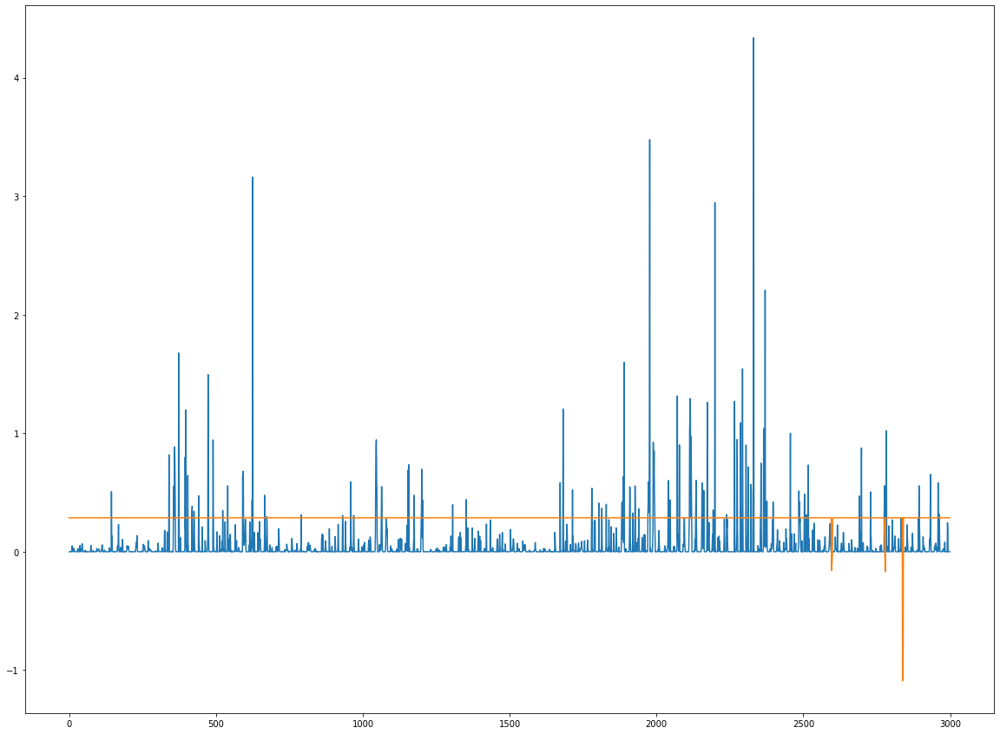

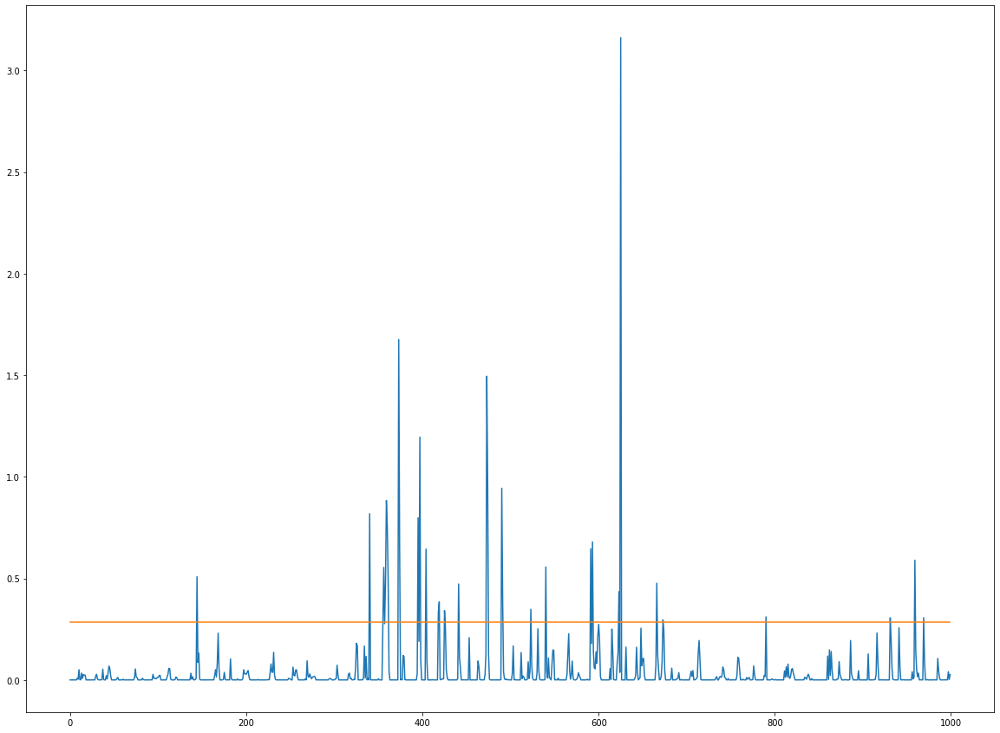

In [10]:
results = model.predict(X_val_scaled)#, y_val_log.values)#, batch_size=128)

#print(X_val_scaled, y_val_log.values, results)
plt.figure(figsize=(20,15))

plt.plot(y_val_erg.values[:3000])
plt.plot(results[:3000])
plt.show()
plt.figure(figsize=(20,15))

plt.plot(y_val_erg.values[:1000])
plt.plot(results[:1000])
plt.show()

In [13]:
X1=X.reshape((X.shape[0],1,148))
X_test1=X_test.reshape((X_test.shape[0],1,148))


input1 = Input(shape=(1,148))

model=Dense(int(32), activation='relu')(input1)

merged=TimeDistributed(Flatten())(model)
merged=LSTM(8,activation='relu')(merged)

output = Dense(4, activation='relu')(merged)
output = Dense(1)(output)

merged_model = Model(inputs = input1, outputs =output )
merged_model.compile(loss='mse', optimizer='adam', metrics=['mse'])
merged_model.summary()
merged_model.fit(X1, y_train_erg, validation_data=(X_test1, y_val_erg), batch_size=8192, epochs=10,shuffle=True)


Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 1, 148)            0         
_________________________________________________________________
dense_15 (Dense)             (None, 1, 32)             4768      
_________________________________________________________________
time_distributed_3 (TimeDist (None, 1, 32)             0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 8)                 1312      
_________________________________________________________________
dense_16 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_17 (Dense)             (None, 1)                 5         
Total params: 6,121
Trainable params: 6,121
Non-trainable params: 0
_________________________________________________________

In [14]:
X1=X.reshape((X.shape[0],1,148))
X_test1=X_test.reshape((X_test.shape[0],1,148))


input1 = Input(shape=(1,148))

model=Dense(int(148), activation='relu')(input1)

merged=TimeDistributed(Flatten())(input1)
merged=LSTM(32,activation='relu')(merged)

output = Dense(4, activation='relu')(merged)
output = Dense(1, activation='relu')(output)

merged_model = Model(inputs = input1, outputs =output )
merged_model.compile(loss='mse', optimizer='adam', metrics=['mse'])
merged_model.summary()
merged_model.fit(X1, y_train_erg, validation_data=(X_test1, y_val_erg), batch_size=8192, epochs=10,shuffle=True)

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 1, 148)            0         
_________________________________________________________________
time_distributed_4 (TimeDist (None, 1, 148)            0         
_________________________________________________________________
lstm_4 (LSTM)                (None, 32)                23168     
_________________________________________________________________
dense_19 (Dense)             (None, 4)                 132       
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 5         
Total params: 23,305
Trainable params: 23,305
Non-trainable params: 0
_________________________________________________________________
Train on 1838283 samples, validate on 55210 samples
Epoch 1/10
1838283/1838283 [==============================] - 9s 5us/

In [16]:
import tensorflow as tf

X1=X.reshape((X.shape[0],1,148))
X_test1=X_test.reshape((X_test.shape[0],1,148))


input1 = Input(shape=(1,148))

model=Dense(int(148), activation='relu')(input1)

merged=TimeDistributed(Flatten())(input1)
merged=LSTM(32,activation='relu')(merged)

output = Dense(4, activation='relu')(merged)
output = Dense(1, activation='relu')(output)

merged_model = Model(inputs = input1, outputs =output )
merged_model.compile(loss=tf.keras.losses.MeanSquaredLogarithmicError(), optimizer='adam', metrics=['mse'])
merged_model.summary()
merged_model.fit(X1, y_train_erg, validation_data=(X_test1, y_val_erg), batch_size=8192, epochs=100,shuffle=True)

Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 1, 148)            0         
_________________________________________________________________
time_distributed_6 (TimeDist (None, 1, 148)            0         
_________________________________________________________________
lstm_6 (LSTM)                (None, 32)                23168     
_________________________________________________________________
dense_25 (Dense)             (None, 4)                 132       
_________________________________________________________________
dense_26 (Dense)             (None, 1)                 5         
Total params: 23,305
Trainable params: 23,305
Non-trainable params: 0
_________________________________________________________________
Train on 1838283 samples, validate on 55210 samples
Epoch 1/100
1838283/1838283 [==============================] - 8s 4us

Epoch 50/100
1838283/1838283 [==============================] - 7s 4us/step - loss: 0.0180 - mse: 24538.3145 - val_loss: 0.0153 - val_mse: 0.1140
Epoch 51/100
1838283/1838283 [==============================] - 7s 4us/step - loss: 0.0180 - mse: 24538.2734 - val_loss: 0.0152 - val_mse: 0.1141
Epoch 52/100
1838283/1838283 [==============================] - 7s 4us/step - loss: 0.0180 - mse: 24538.2891 - val_loss: 0.0155 - val_mse: 0.1150
Epoch 53/100
1838283/1838283 [==============================] - 7s 4us/step - loss: 0.0180 - mse: 24538.3066 - val_loss: 0.0152 - val_mse: 0.1136
Epoch 54/100
1838283/1838283 [==============================] - 7s 4us/step - loss: 0.0180 - mse: 24538.2891 - val_loss: 0.0153 - val_mse: 0.1140
Epoch 55/100
1838283/1838283 [==============================] - 7s 4us/step - loss: 0.0179 - mse: 24538.2832 - val_loss: 0.0151 - val_mse: 0.1135
Epoch 56/100
1838283/1838283 [==============================] - 7s 4us/step - loss: 0.0179 - mse: 24538.2852 - val_loss: 0.0

In [18]:
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten
import tensorflow as tf
#create model
model = Sequential()
#add model layers

model.add(Dense(int(32), activation='relu'))
model.add(Dense(22, activation='relu'))
model.add(Dense(4, activation='relu'))
model.add(Dense(1))

#compile model using accuracy to measure model performance
model.compile(loss=tf.keras.losses.MeanSquaredLogarithmicError(), optimizer='adam', metrics=['mean_squared_logarithmic_error'])

model.fit(X, np.array(y_train_erg), validation_data=(X_test, np.array(y_val_erg)), batch_size=8192, epochs=10,shuffle=True)

Train on 1838283 samples, validate on 55210 samples
Epoch 1/10
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0281 - mean_squared_logarithmic_error: 0.0281 - val_loss: 0.0230 - val_mean_squared_logarithmic_error: 0.0230
Epoch 2/10
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0227 - mean_squared_logarithmic_error: 0.0227 - val_loss: 0.0182 - val_mean_squared_logarithmic_error: 0.0182
Epoch 3/10
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0203 - mean_squared_logarithmic_error: 0.0203 - val_loss: 0.0169 - val_mean_squared_logarithmic_error: 0.0169
Epoch 4/10
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0198 - mean_squared_logarithmic_error: 0.0198 - val_loss: 0.0165 - val_mean_squared_logarithmic_error: 0.0165
Epoch 5/10
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0196 - mean_squared_logarithmic_error: 0.0196 - val_loss: 0.0162 - val_mean_squared_loga

In [20]:
model = Sequential()
#add model layers

model.add(Dense(16, activation='relu'))
model.add(Dense(4, activation='relu'))

model.add(Dense(1))

#compile model using accuracy to measure model performance
model.compile(loss=tf.keras.losses.MeanSquaredLogarithmicError(), optimizer='adam', metrics=['mean_squared_logarithmic_error'])

model.fit(X, np.array(y_train_erg), validation_data=(X_test, np.array(y_val_erg)), batch_size=8192, epochs=40,shuffle=True)

Train on 1838283 samples, validate on 55210 samples
Epoch 1/40
1838283/1838283 [==============================] - 5s 2us/step - loss: 0.0314 - mean_squared_logarithmic_error: 0.0314 - val_loss: 0.0246 - val_mean_squared_logarithmic_error: 0.0246
Epoch 2/40
1838283/1838283 [==============================] - 4s 2us/step - loss: 0.0255 - mean_squared_logarithmic_error: 0.0255 - val_loss: 0.0229 - val_mean_squared_logarithmic_error: 0.0229
Epoch 3/40
1838283/1838283 [==============================] - 4s 2us/step - loss: 0.0246 - mean_squared_logarithmic_error: 0.0246 - val_loss: 0.0225 - val_mean_squared_logarithmic_error: 0.0225
Epoch 4/40
1838283/1838283 [==============================] - 4s 2us/step - loss: 0.0243 - mean_squared_logarithmic_error: 0.0243 - val_loss: 0.0222 - val_mean_squared_logarithmic_error: 0.0222
Epoch 5/40
1838283/1838283 [==============================] - 4s 2us/step - loss: 0.0239 - mean_squared_logarithmic_error: 0.0239 - val_loss: 0.0214 - val_mean_squared_loga

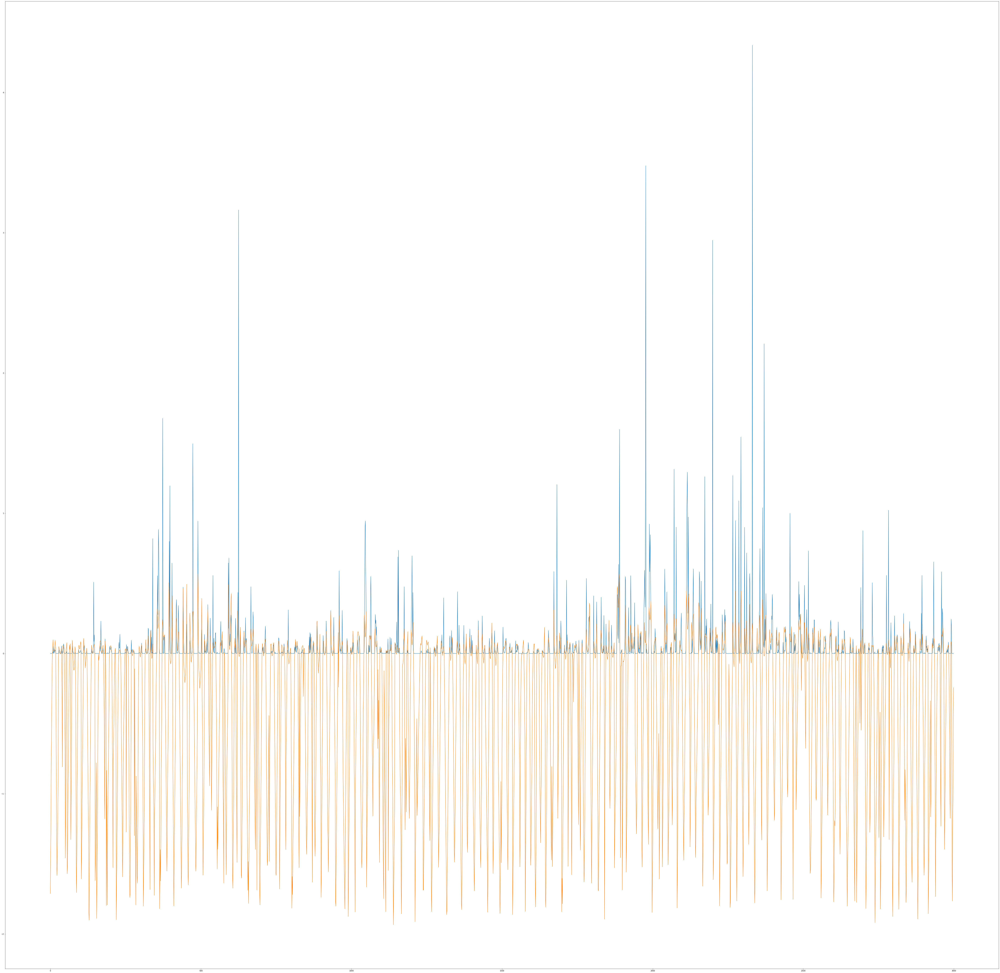

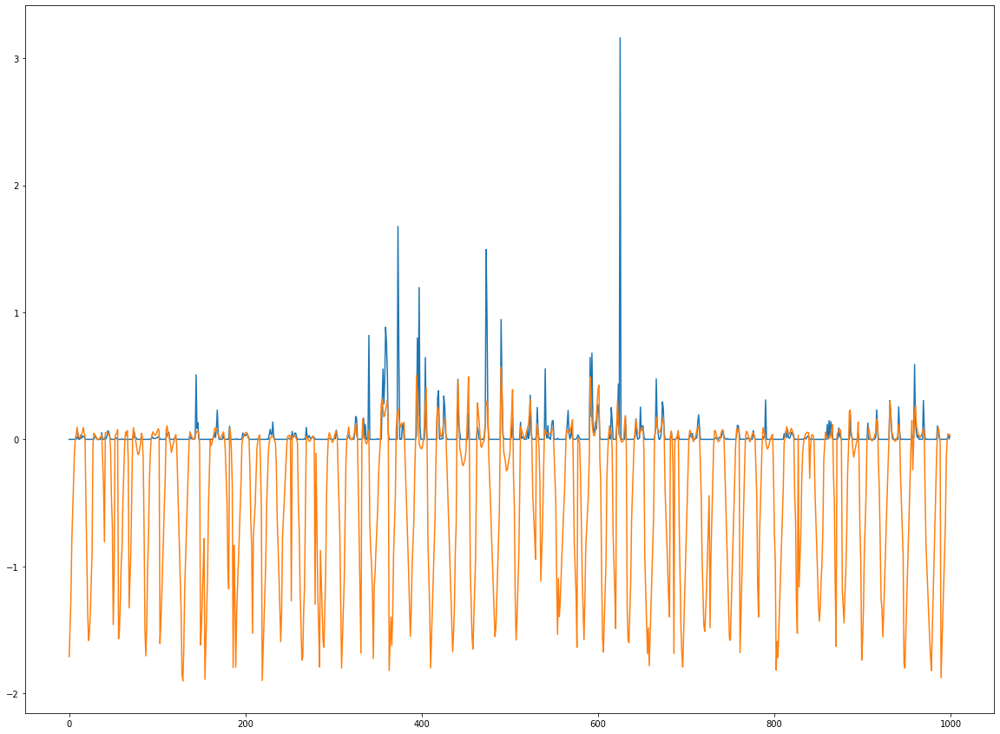

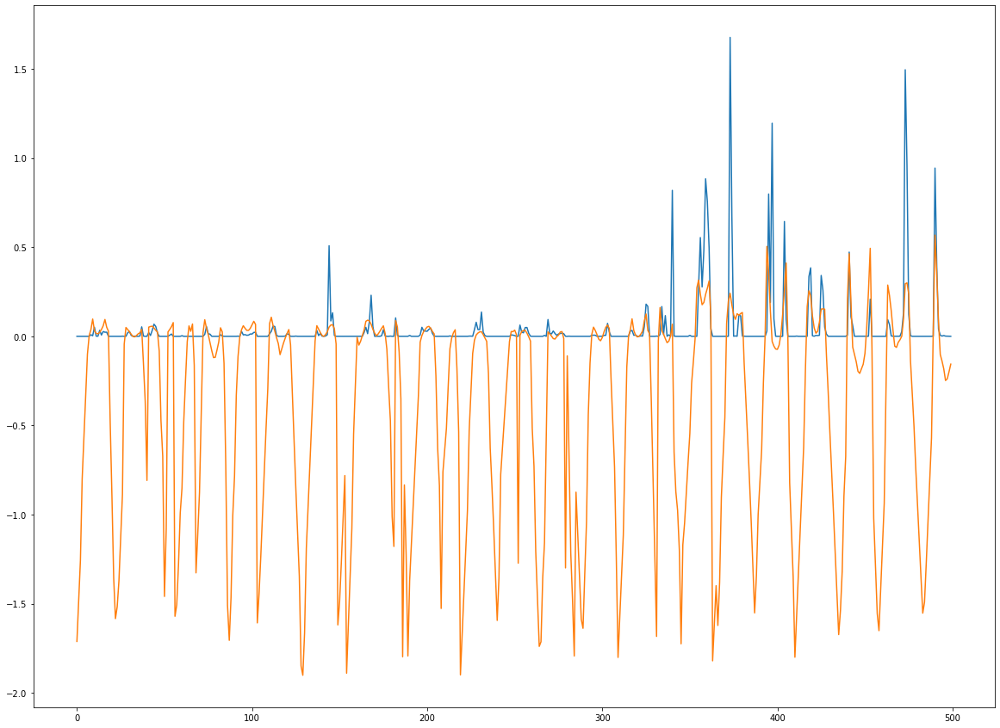

In [21]:
results = model.predict(X_val_scaled)#, y_val_log.values)#, batch_size=128)


plt.figure(figsize=(100,100))

plt.plot(y_val_erg.values[:3000])
plt.plot(results[:3000])
plt.show()
plt.figure(figsize=(20,15))

plt.plot(y_val_erg.values[:1000])
plt.plot(results[:1000])
plt.show()

plt.figure(figsize=(20,15))

plt.plot(y_val_erg.values[:500])
plt.plot(results[:500])
plt.show()

In [22]:
model = Sequential()
#add model layers

model.add(Dense(16, activation='relu'))
model.add(Dense(4, activation='relu'))

model.add(Dense(1 ,activation='relu'))

#compile model using accuracy to measure model performance
model.compile(loss=tf.keras.losses.MeanSquaredLogarithmicError(), optimizer='adam', metrics=['mean_squared_logarithmic_error'])

model.fit(X, np.array(y_train_erg), validation_data=(X_test, np.array(y_val_erg)), batch_size=8192, epochs=40,shuffle=True)

Train on 1838283 samples, validate on 55210 samples
Epoch 1/40
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0279 - mean_squared_logarithmic_error: 0.0279 - val_loss: 0.0246 - val_mean_squared_logarithmic_error: 0.0246
Epoch 2/40
1838283/1838283 [==============================] - 5s 2us/step - loss: 0.0251 - mean_squared_logarithmic_error: 0.0251 - val_loss: 0.0228 - val_mean_squared_logarithmic_error: 0.0228
Epoch 3/40
1838283/1838283 [==============================] - 5s 2us/step - loss: 0.0241 - mean_squared_logarithmic_error: 0.0241 - val_loss: 0.0217 - val_mean_squared_logarithmic_error: 0.0217
Epoch 4/40
1838283/1838283 [==============================] - 4s 2us/step - loss: 0.0227 - mean_squared_logarithmic_error: 0.0227 - val_loss: 0.0187 - val_mean_squared_logarithmic_error: 0.0187
Epoch 5/40
1838283/1838283 [==============================] - 5s 2us/step - loss: 0.0207 - mean_squared_logarithmic_error: 0.0207 - val_loss: 0.0175 - val_mean_squared_loga

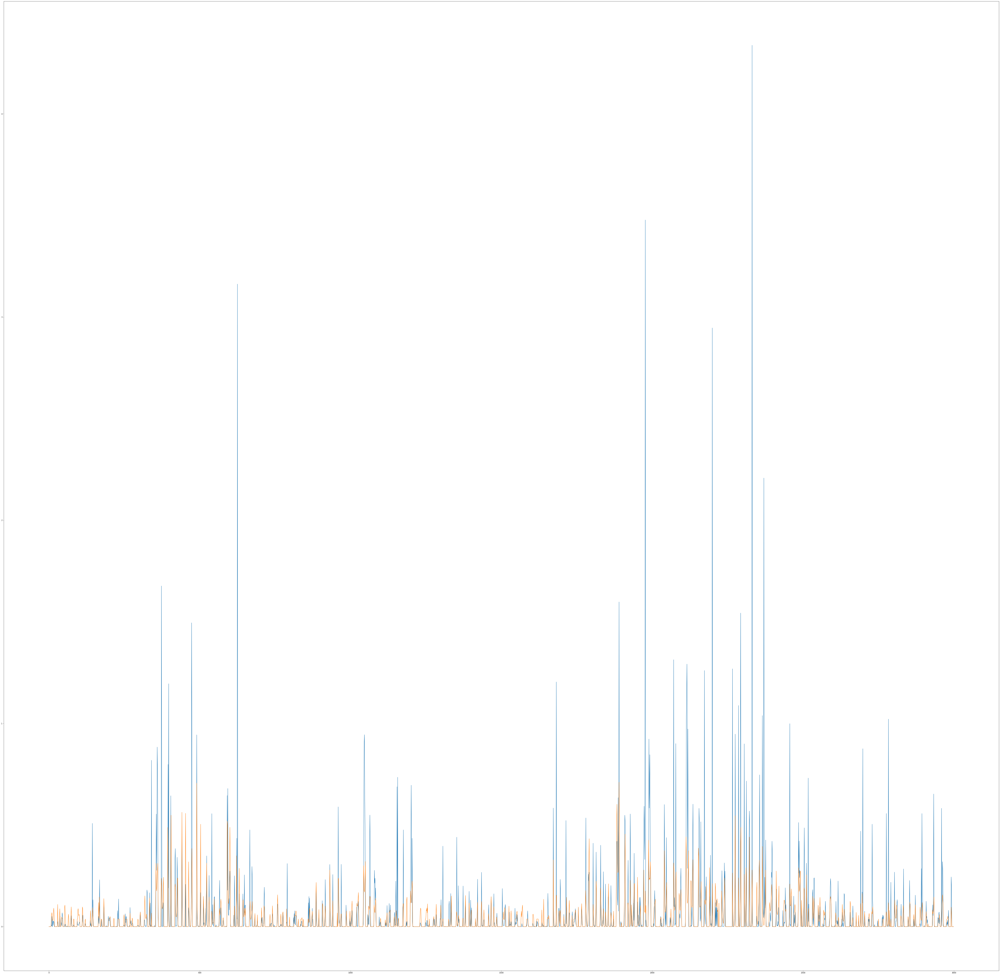

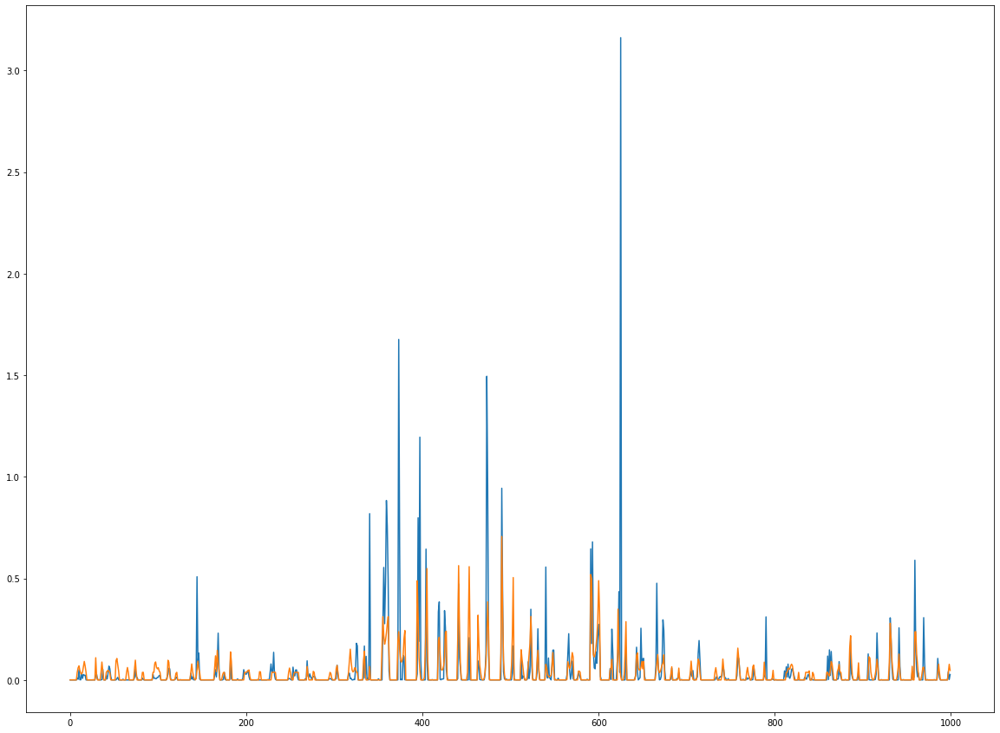

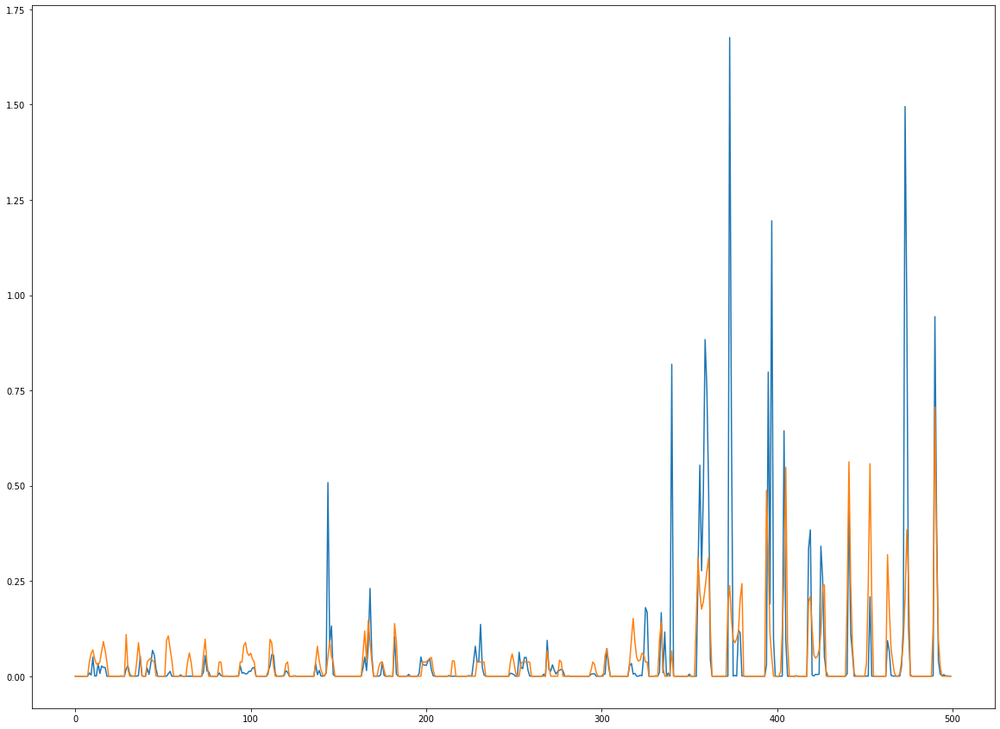

In [23]:
results = model.predict(X_val_scaled)#, y_val_log.values)#, batch_size=128)


plt.figure(figsize=(100,100))

plt.plot(y_val_erg.values[:3000])
plt.plot(results[:3000])
plt.show()
plt.figure(figsize=(20,15))

plt.plot(y_val_erg.values[:1000])
plt.plot(results[:1000])
plt.show()

plt.figure(figsize=(20,15))

plt.plot(y_val_erg.values[:500])
plt.plot(results[:500])
plt.show()

In [41]:
model = Sequential()
#add model layers

model.add(Dense(148,activation='relu'))
model.add(Dense(22, activation='relu'))
model.add(Dense(4, activation='relu'))

model.add(Dense(1 ,activation='relu'))

#compile model using accuracy to measure model performance
model.compile(loss=tf.keras.losses.MeanSquaredLogarithmicError(), optimizer='adam', metrics=['mean_squared_logarithmic_error'])

model.fit(X, np.array(y_train_erg), validation_data=(X_test, np.array(y_val_erg)), batch_size=8192, epochs=100,shuffle=True)

Train on 1838283 samples, validate on 55210 samples
Epoch 1/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0289 - mean_squared_logarithmic_error: 0.0289 - val_loss: 0.0281 - val_mean_squared_logarithmic_error: 0.0281
Epoch 2/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0289 - mean_squared_logarithmic_error: 0.0289 - val_loss: 0.0281 - val_mean_squared_logarithmic_error: 0.0281
Epoch 3/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0289 - mean_squared_logarithmic_error: 0.0289 - val_loss: 0.0281 - val_mean_squared_logarithmic_error: 0.0281
Epoch 4/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0289 - mean_squared_logarithmic_error: 0.0289 - val_loss: 0.0281 - val_mean_squared_logarithmic_error: 0.0281
Epoch 5/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0289 - mean_squared_logarithmic_error: 0.0289 - val_loss: 0.0281 - val_mean_squared

Epoch 84/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0289 - mean_squared_logarithmic_error: 0.0289 - val_loss: 0.0281 - val_mean_squared_logarithmic_error: 0.0281
Epoch 85/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0289 - mean_squared_logarithmic_error: 0.0289 - val_loss: 0.0281 - val_mean_squared_logarithmic_error: 0.0281
Epoch 86/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0289 - mean_squared_logarithmic_error: 0.0289 - val_loss: 0.0281 - val_mean_squared_logarithmic_error: 0.0281
Epoch 87/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0289 - mean_squared_logarithmic_error: 0.0289 - val_loss: 0.0281 - val_mean_squared_logarithmic_error: 0.0281
Epoch 88/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 0.0289 - mean_squared_logarithmic_error: 0.0289 - val_loss: 0.0281 - val_mean_squared_logarithmic_error: 0.0281
Epoch 89/100
1838283

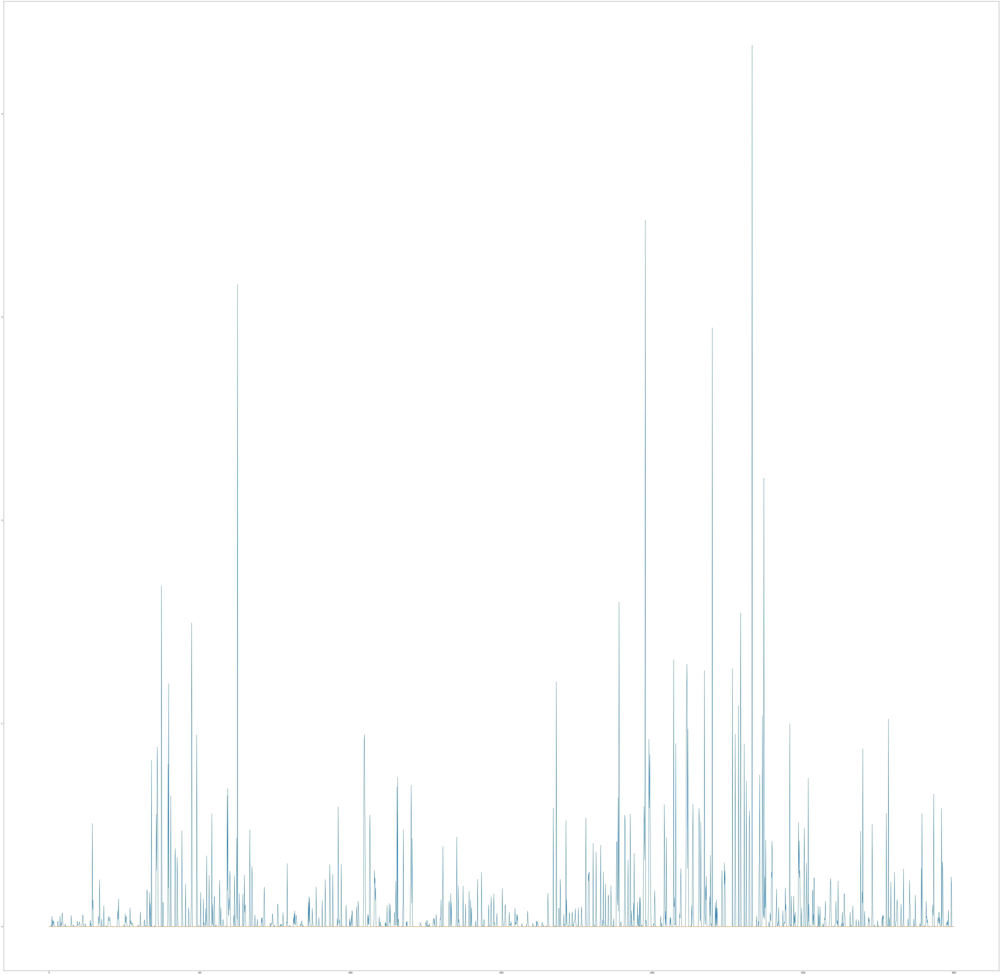

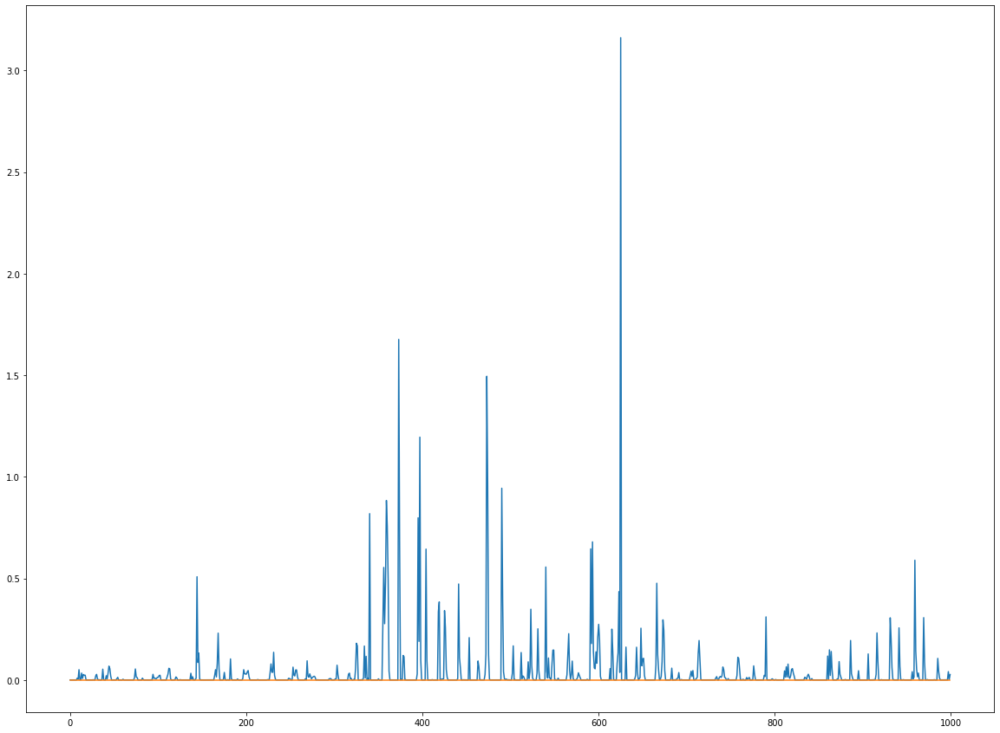

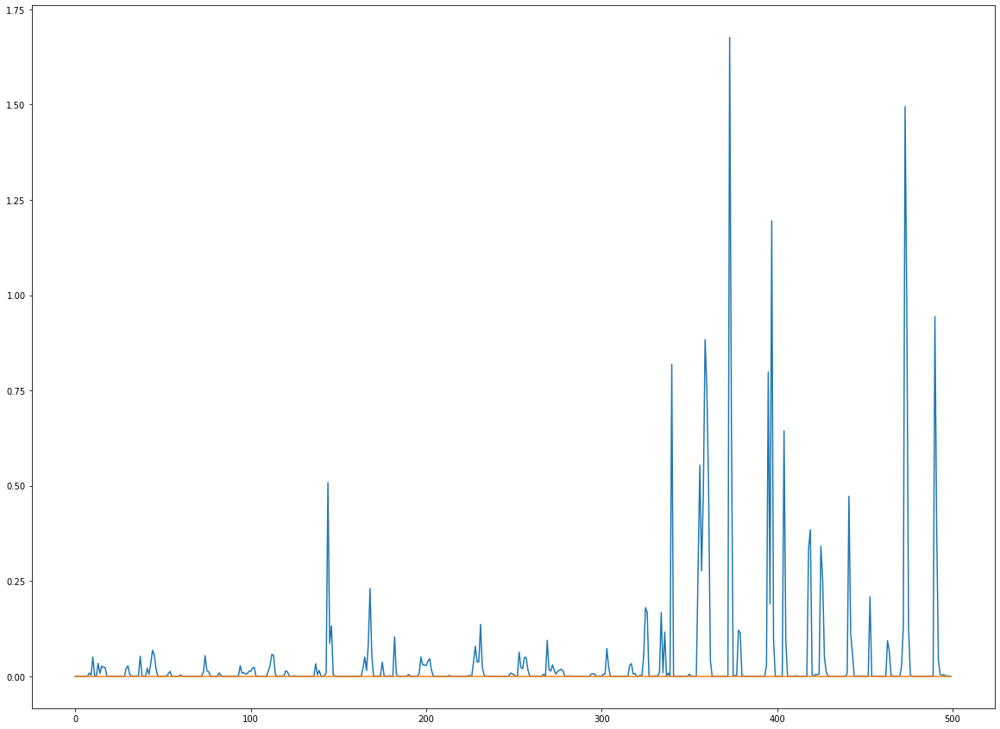

In [42]:
results = model.predict(X_val_scaled)#, y_val_log.values)#, batch_size=128)

model.save('custom_no_log_12')

plt.figure(figsize=(100,100))

plt.plot(y_val_erg.values[:3000])
plt.plot(results[:3000])
plt.show()
plt.figure(figsize=(20,15))

plt.plot(y_val_erg.values[:1000])
plt.plot(results[:1000])
plt.show()

plt.figure(figsize=(20,15))

plt.plot(y_val_erg.values[:500])
plt.plot(results[:500])
plt.show()

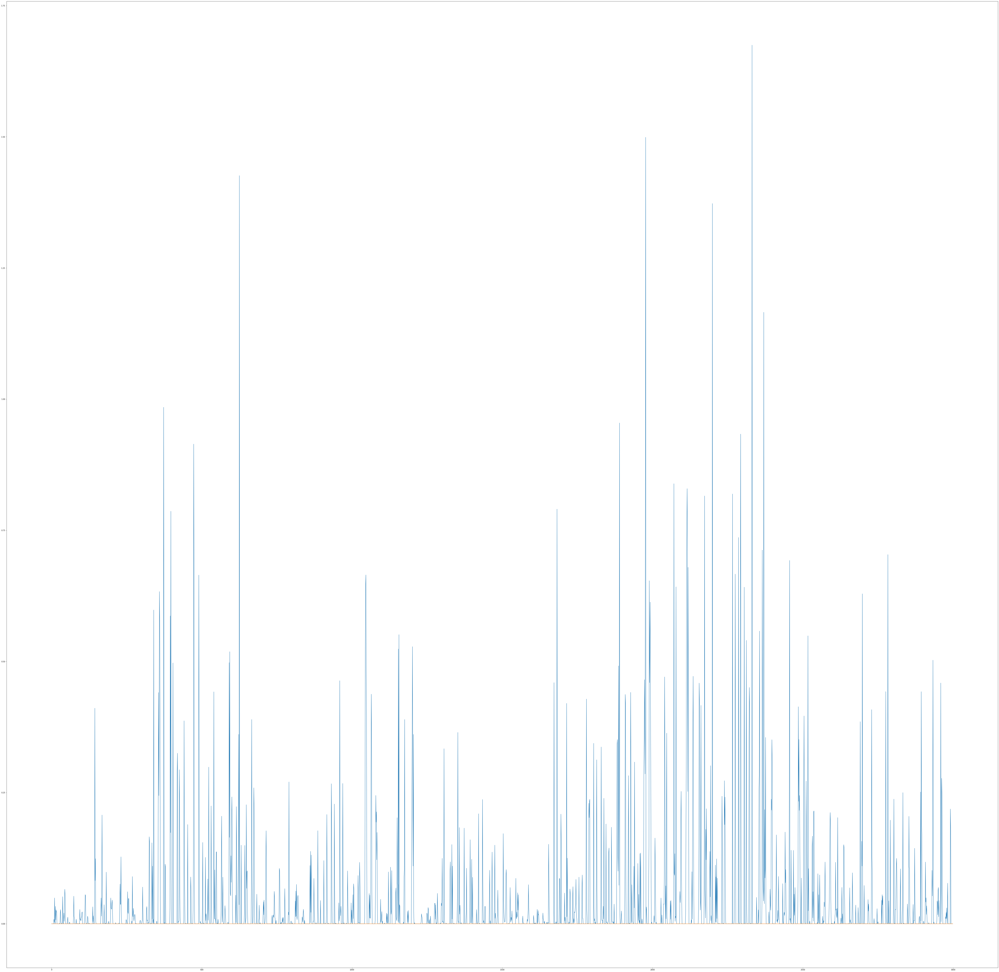

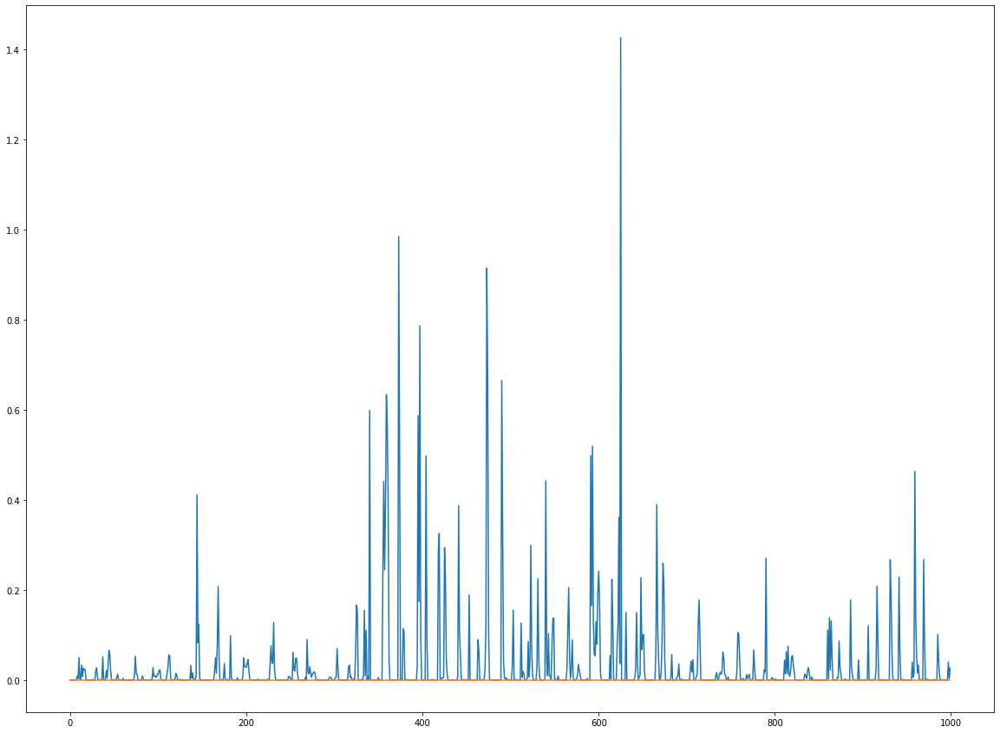

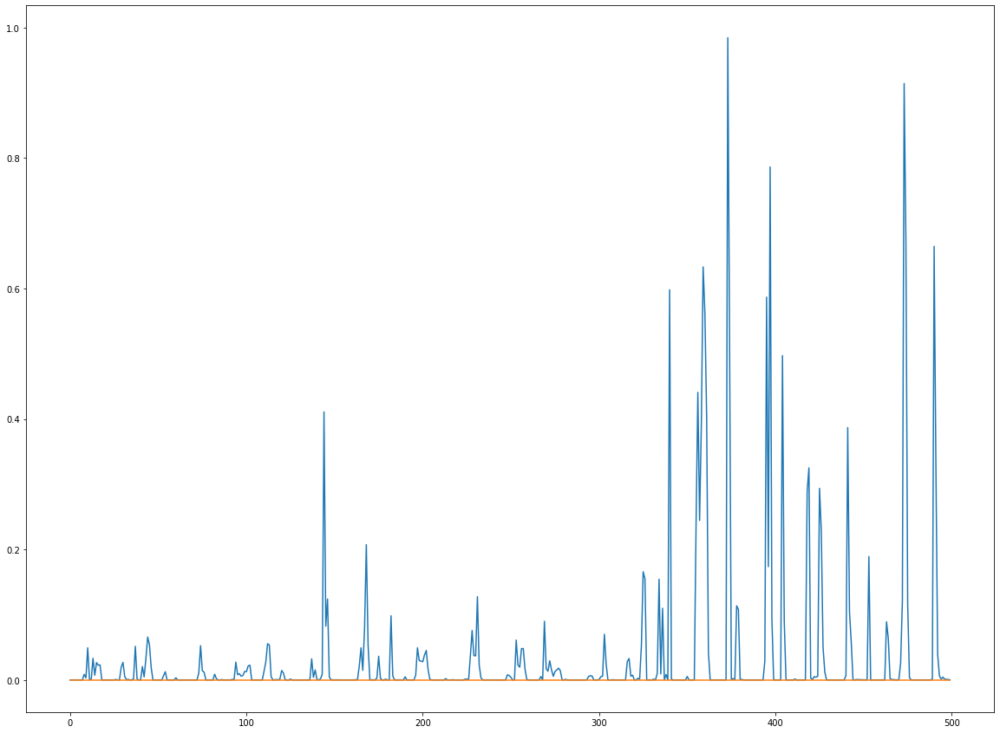

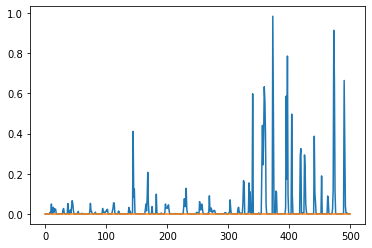

In [43]:
results = np.log(model.predict(X_val_scaled)+1)#, y_val_log.values)#, batch_size=128)



plt.figure(figsize=(100,100))

plt.plot( np.log(y_val_erg.values[:3000]+1))
plt.plot(results[:3000])
plt.show()
plt.figure(figsize=(20,15))

plt.plot( np.log(y_val_erg.values[:1000]+1))
plt.plot(results[:1000])
plt.show()

plt.figure(figsize=(20,15))

plt.plot( np.log(y_val_erg.values[:500]+1))
plt.plot(results[:500])
plt.show()

plt.figure()

plt.plot( np.log(y_val_erg.values[:500]+1))
plt.plot(results[:500])
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log10
  after removing the cwd from sys.path.


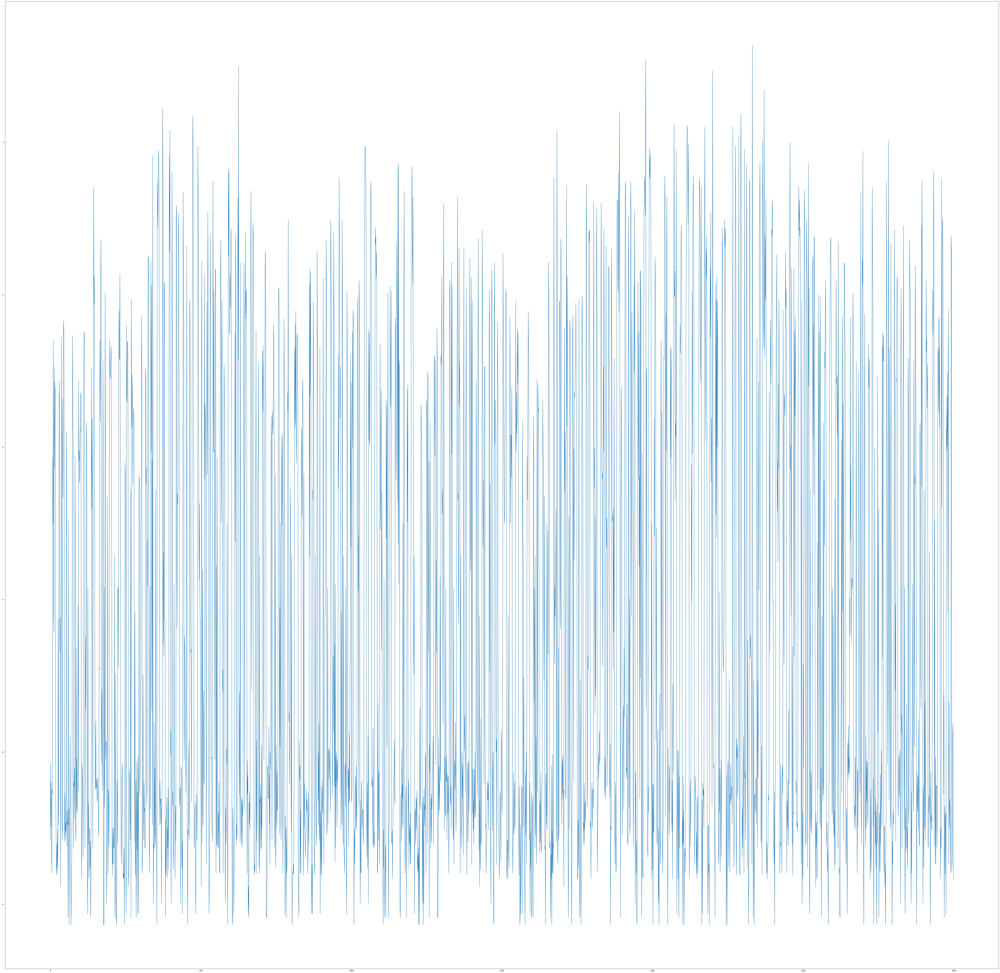

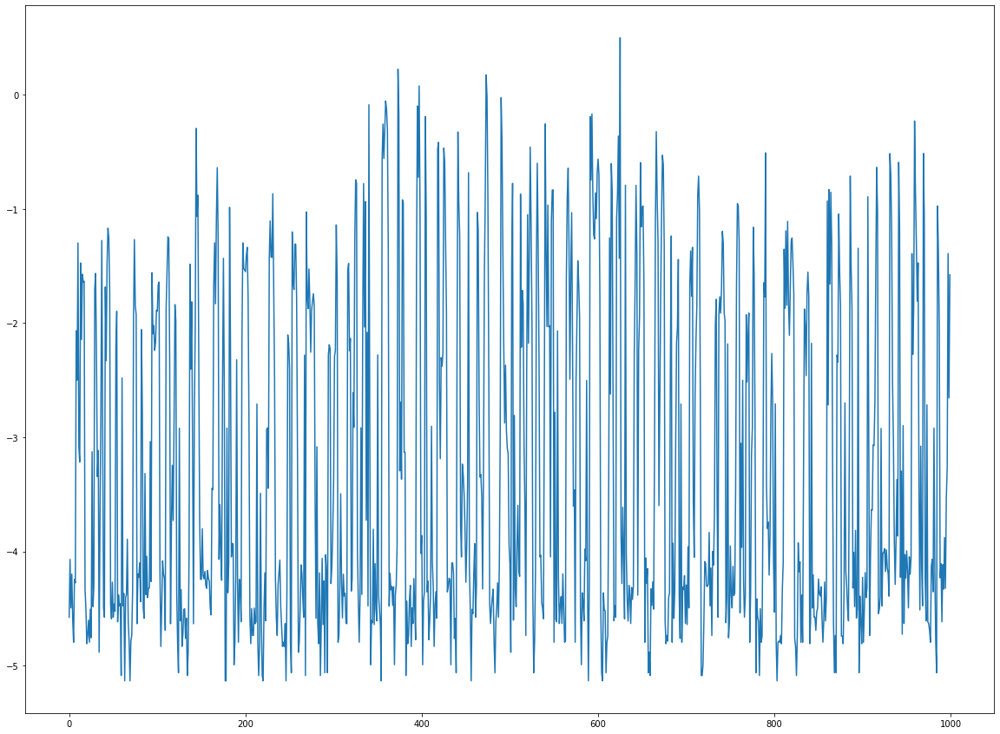

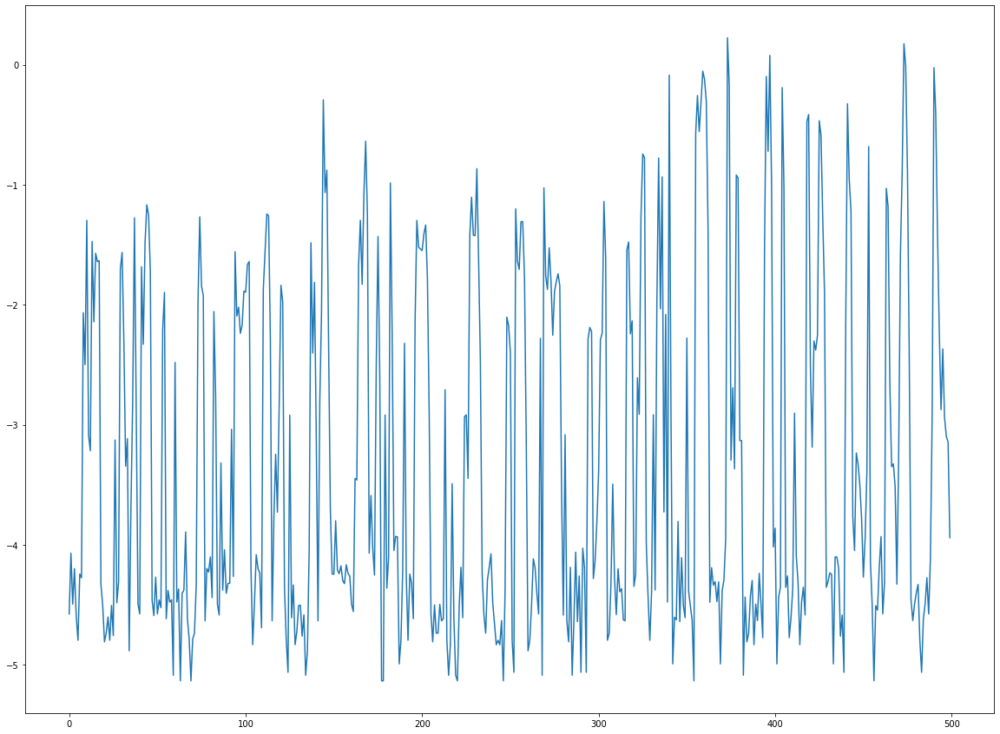

min -5.132820614352472 max high 1.4057335189788458 mean true -2.9752208124644044 mean pred -inf median ytrue -3.4771703705480483


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in double_scalars


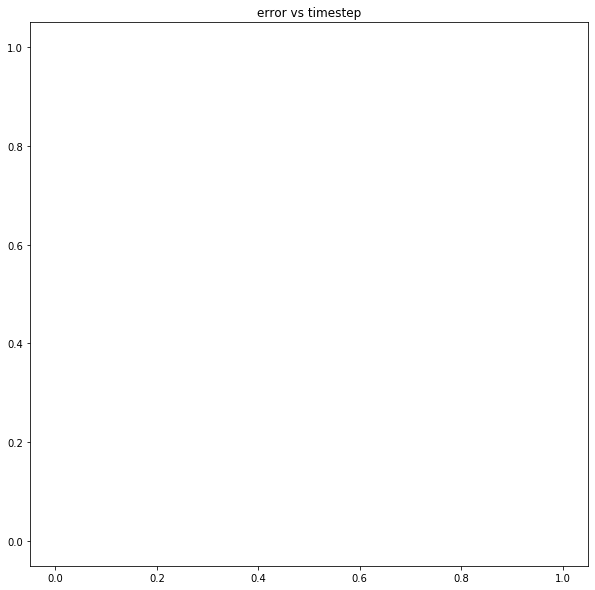

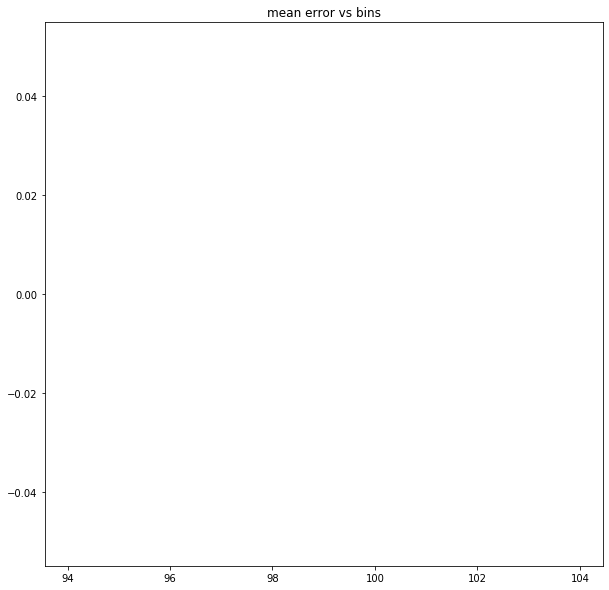

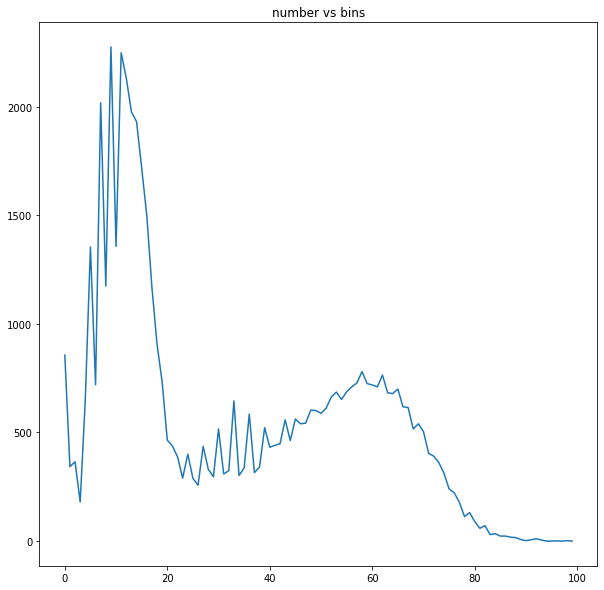

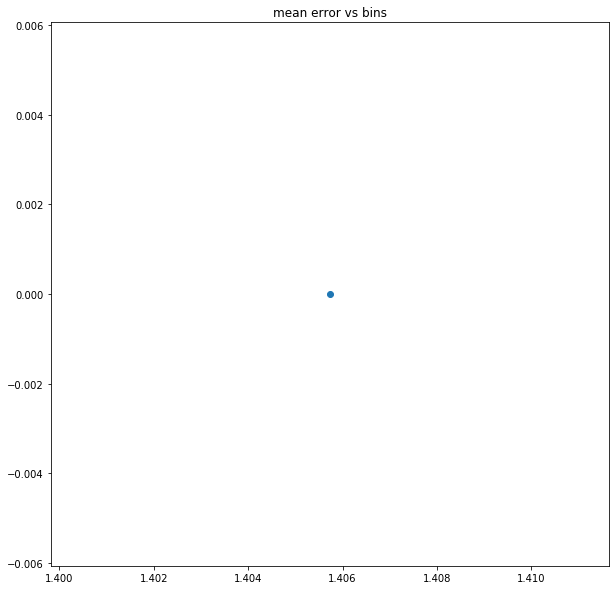

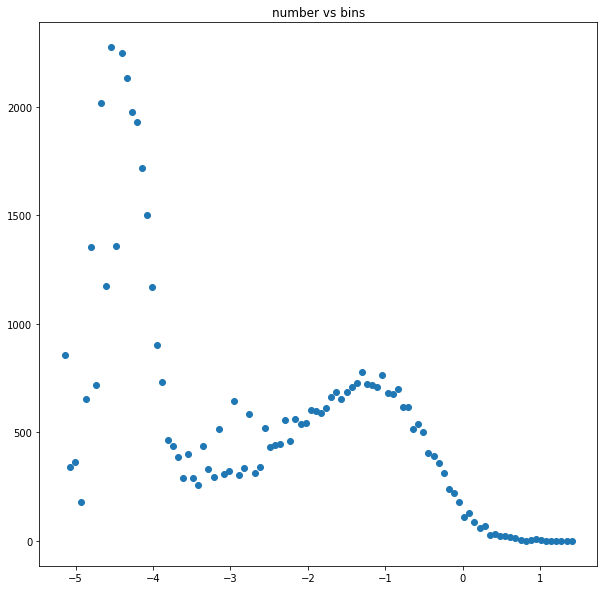

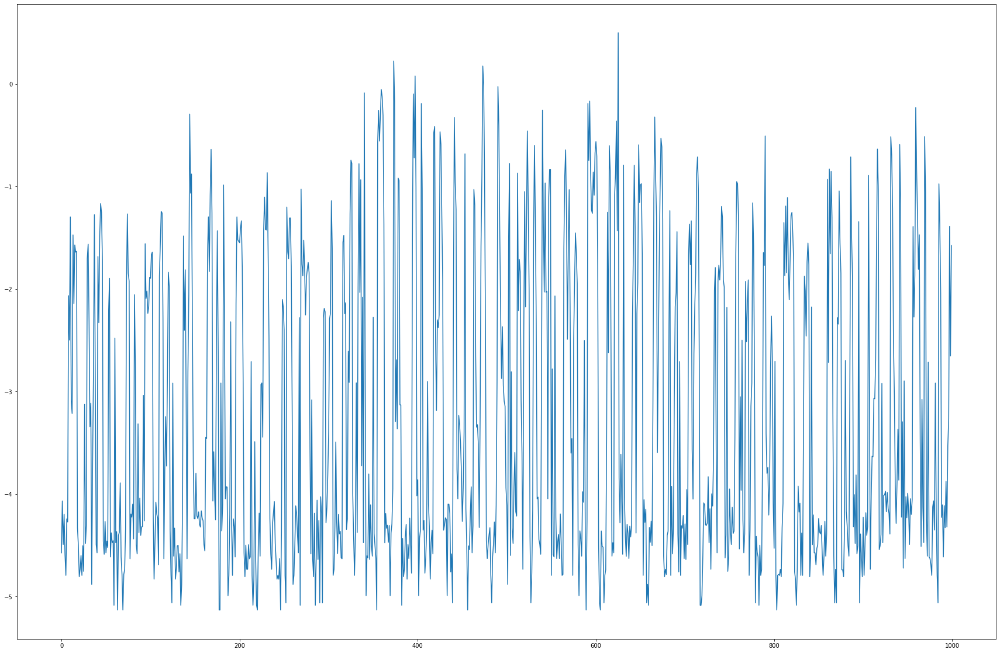

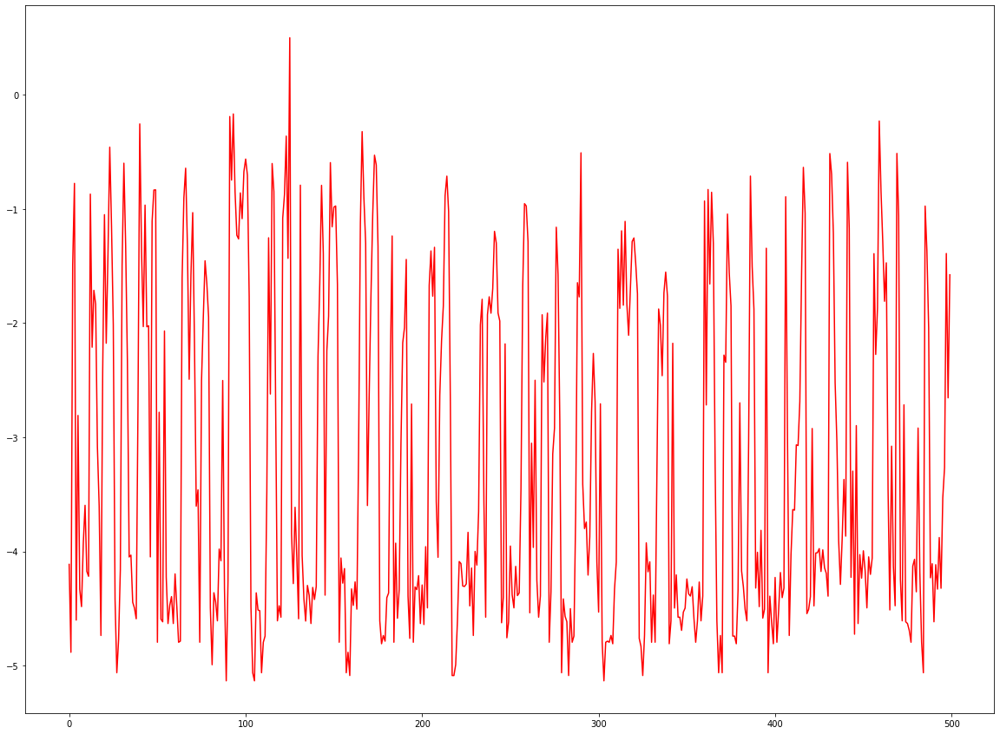

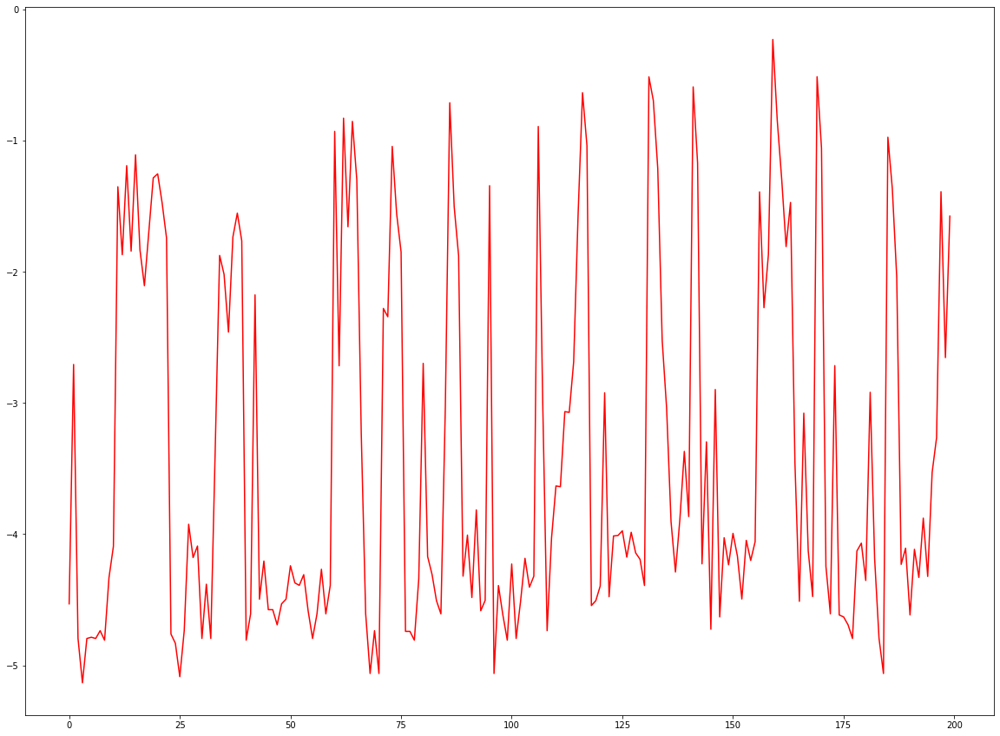

In [44]:
model = tf.keras.models.load_model('custom_no_log_12')


results = np.log10(model.predict(X_val_scaled))#, y_val_log.values)#, batch_size=128)



plt.figure(figsize=(100,100))

plt.plot( np.log10(y_val_erg.values[:3000]))
plt.plot(results[:3000])
plt.show()
plt.figure(figsize=(20,15))

plt.plot( np.log10(y_val_erg.values[:1000]))
plt.plot(results[:1000])
plt.show()

plt.figure(figsize=(20,15))

plt.plot( np.log10(y_val_erg.values[:500]))
plt.plot(results[:500])
plt.show()



y_pred=results
bins, mean_error_and_num=mean_errors_over_range(np.log10(y_val_erg.values), (y_pred[:,0]),100)


plt.figure(figsize=(30,20))

plt.plot(np.log10(y_val_erg[0:1000].values))
plt.plot((y_pred[0:1000]))
plt.show()
plt.figure(figsize=(20,15))

plt.plot((y_pred[500:1000]))
plt.plot(np.log10(y_val_erg[500:1000].values),'r')
plt.show
plt.figure(figsize=(20,15))

plt.plot((y_pred[800:1000]))
plt.plot(np.log10(y_val_erg[800:1000].values),'r')
plt.show()

In [ ]:
model = Sequential()
#add model layers

model.add(Dense(148,activation='relu'))
model.add(Dense(22, activation='relu'))
model.add(Dense(4, activation='relu'))

model.add(Dense(1 ,activation='relu'))

#compile model using accuracy to measure model performance
model.compile(loss=tf.keras.losses.MeanSquaredLogarithmicError(), optimizer='adam', metrics=['mean_squared_logarithmic_error', 'mse'])

model.fit(X, np.array(y_train), validation_data=(X_test, np.array(y_val)), batch_size=8192, epochs=100,shuffle=True)

Train on 1838283 samples, validate on 55210 samples
Epoch 1/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 297.7748 - mean_squared_logarithmic_error: 297.7749 - mse: 9559267471527379726288027648.0000 - val_loss: 233.1549 - val_mean_squared_logarithmic_error: 233.1549 - val_mse: 54984312742577564549120.0000
Epoch 2/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 217.7764 - mean_squared_logarithmic_error: 217.7764 - mse: 9559266290935759008876724224.0000 - val_loss: 192.2032 - val_mean_squared_logarithmic_error: 192.2032 - val_mse: 54984312742577564549120.0000
Epoch 3/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 185.8058 - mean_squared_logarithmic_error: 185.8058 - mse: 9559271603598052237227589632.0000 - val_loss: 168.4184 - val_mean_squared_logarithmic_error: 168.4185 - val_mse: 54984312742577564549120.0000
Epoch 4/100
1838283/1838283 [==============================] - 5s 3us/step - loss: 165.2314 - me

In [ ]:
results = np.log10(model.predict(X_val_scaled))#, y_val_log.values)#, batch_size=128)



plt.figure(figsize=(20,15))

plt.plot( np.log10(y_val.values[:3000]))
plt.plot(results[:3000])
plt.show()
plt.figure(figsize=(20,15))

plt.plot( np.log10(y_val.values[:1000]))
plt.plot(results[:1000])
plt.show()

plt.figure(figsize=(20,15))

plt.plot( np.log10(y_val.values[:500]))
plt.plot(results[:500])
plt.show()

model.save('custom_no_log_13')

y_pred=results
bins, mean_error_and_num=mean_errors_over_range(np.log10(y_val.values), (y_pred[:,0]),100)


plt.figure(figsize=(30,20))

plt.plot(np.log10(y_val.values[0:1000]))
plt.plot((y_pred[0:1000]))
plt.show()
plt.figure(figsize=(20,15))

plt.plot((y_pred[500:1000]))
plt.plot(np.log10(y_val.values[500:1000]),'r')
plt.show
plt.figure(figsize=(20,15))

plt.plot((y_pred[800:1000]))
plt.plot(np.log10(y_val.values[800:1000]),'r')
plt.show()

In [ ]:
model = Sequential()
#add model layers

model.add(Dense(148,activation='relu'))
model.add(Dense(22, activation='relu'))
model.add(Dense(4, activation='relu'))

model.add(Dense(1 ,activation='relu'))

#compile model using accuracy to measure model performance
model.compile(loss=tf.keras.losses.MeanSquaredLogarithmicError(), optimizer='adam', metrics=['mean_squared_logarithmic_error', 'mse'])

model.fit(X, np.array(y_train_erg), validation_data=(X_test, np.array(y_val_erg)), batch_size=8192, epochs=1000,shuffle=True)

In [ ]:
results = np.log10(model.predict(X_val_scaled))#, y_val_log.values)#, batch_size=128)



plt.figure(figsize=(100,100))

plt.plot( np.log10(y_val_erg.values[:3000]))
plt.plot(results[:3000])
plt.show()
plt.figure(figsize=(20,15))

plt.plot( np.log10(y_val_erg.values[:1000]))
plt.plot(results[:1000])
plt.show()

plt.figure(figsize=(20,15))

plt.plot( np.log10(y_val_erg.values[:500]))
plt.plot(results[:500])
plt.show()


model.save('custom_no_log_14')

y_pred=results
bins, mean_error_and_num=mean_errors_over_range(np.log10(y_val_erg.values), (y_pred[:,0]),100)


plt.figure(figsize=(30,20))

plt.plot(np.log10(y_val_erg[0:1000].values))
plt.plot((y_pred[0:1000,0]))
plt.show()
plt.figure(figsize=(20,15))

plt.plot((y_pred[500:1000,0]))
plt.plot(np.log10(y_val_erg[500:1000].values),'r')
plt.show
plt.figure(figsize=(20,15))

plt.plot((y_pred[800:1000,0]))
plt.plot(np.log10(y_val_erg[800:1000,0].values),'r')
plt.show()